<a href="https://colab.research.google.com/github/bioinformatics-inca/ELAB_scRNASeq/blob/main/LNCC_NOTEBOOK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Characterizing subpopulations of oncological interest through single-cell RNA-Seq: clustering, reference mapping, cluster annotation and trajectory inference**

This notebook provides a comprehensive workflow for characterizing oncologically relevant subpopulations using single-cell RNA sequencing (scRNA-Seq) data. The analysis involves several key steps:

**Clustering**: Identification of distinct cellular subpopulations based on gene expression profiles.

**Reference Mapping**: Aligning clusters to reference datasets for further characterization.

**Cluster Annotation**: Assigning biological meaning to each cluster by identifying marker genes.

**Trajectory Inference**: Reconstructing cell lineage and developmental paths to understand the dynamic behavior of cells over time.

By combining these approaches, we aim to uncover critical insights into tumor heterogeneity and the cellular mechanisms underlying oncogenesis.


Authors: Lucas Aleixo, Gabriela Rapozo, Leandro Santos and Mariana Boroni (LBBC - INCA)

This practical class is based on the *Single-Cell Best Practices* guidelines [¹](https://www.sc-best-practices.org/preamble.html), the review article "Best practices for single-cell data analysis" [²](https://www.nature.com/articles/s41576-023-00586-w), and the book *Orchestrating Single-Cell Analysis with Bioconductor* [³](https://bioconductor.org/books/release/OSCA/).

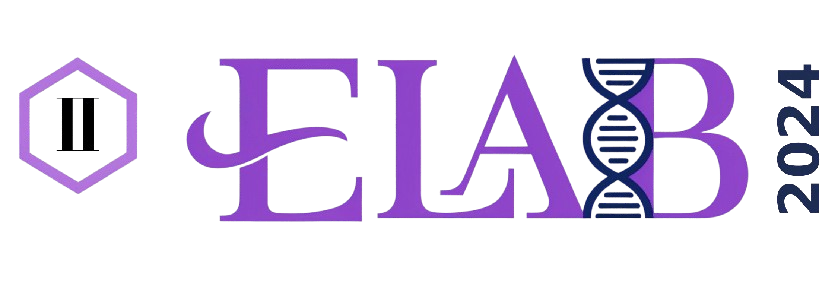

## **1. Setup Environment**


In [ ]:
## instalação r2u + bioc2u
shell_call <- function(command, ...) {
  result <- system(command, intern = TRUE, ...)
  cat(paste0(result, collapse = "\n"))
}

# Install curl if missing
shell_call("apt update -qq")
shell_call("apt install -y --no-install-recommends curl ca-certificates git")

## Setup bioc2u and r2u
shell_call("curl https://raw.githubusercontent.com/Bioconductor/bioc2u/devel/apt_setup.sh | sudo bash")
bspm::enable()
options(bspm.version.check=FALSE)

## Special thanks to Professor Benilton Carvalho
  ## who reduced the package installation time
    ## by an incredible 2000% (from over 1 hour to just 3 minutes)! 😱✨

47 packages can be upgraded. Run 'apt list --upgradable' to see them.Reading package lists...
Building dependency tree...
Reading state information...
ca-certificates is already the newest version (20230311ubuntu0.22.04.1).
curl is already the newest version (7.81.0-1ubuntu1.18).
git is already the newest version (1:2.34.1-1ubuntu1.11).
0 upgraded, 0 newly installed, 0 to remove and 47 not upgraded.47 packages can be upgraded. Run 'apt list --upgradable' to see them.
Reading package lists...
Building dependency tree...
Reading state information...
ca-certificates is already the newest version (20230311ubuntu0.22.04.1).
curl is already the newest version (7.81.0-1ubuntu1.18).
0 upgraded, 0 newly installed, 0 to remove and 47 not upgraded.
47 packages can be upgraded. Run 'apt list --upgradable' to see them.
Reading package lists...
Building dependency tree...
Reading state information...
ca-certificates is already the newest version (20230311ubuntu0.22.04.1).
gnupg is already the newest

Tracing function "install.packages" in package "utils"



In [ ]:
install_and_configure <- function() {

  # Start timing the entire process
  start_time <- Sys.time()

  # Step 1: Install CRAN packages
  cran_packages <- c("Seurat", "SeuratObject","devtools", "remotes", "tidyverse", "cowplot", "BiocManager")

  # Loop through each CRAN package and install it
  for (pkg in cran_packages) {
    install.packages(pkg, quiet = TRUE)  # Install the package quietly
    message(paste0("done ", pkg))  # Print a message after each package is installed
  }

  # Step 2: System commands for dependency installation (if needed)
  # This assumes you're on a Linux environment with apt-get available.
  message("Updating system and installing dependencies...")
  system("apt-get update")  # Update the system package lists
  system("apt-get install -y libcairo2-dev libxt-dev libjpeg-dev libpng-dev libtiff-dev libxml2-dev")  # Install required system dependencies

  # Step 3: Install Bioconductor packages
  bioc_packages <- c("scDblFinder", "clusterProfiler", "preprocessCore", "celldex",
                     "clustree", "SingleR", "decontX", "ComplexHeatmap",
                     "circlize", "Harmony", "SingleCellExperiment")

  # Loop through each Bioconductor package and install it
  for (pkg in bioc_packages) {
    BiocManager::install(pkg, quiet = TRUE)  # Install the package quietly
    message(paste0("done ", pkg))  # Print a message after each package is installed
  }

  devtools::install_github('cole-trapnell-lab/monocle3')
  devtools::install_github('immunogenomics/presto')
  remotes::install_github('satijalab/seurat-wrappers@community-vignette')

  # Step 4: Print completion message
  message("All installations and configurations are complete!")

  # End timing the process
  end_time <- Sys.time()

  # Calculate and print the total duration of the installation process in minutes
  install_time <- as.numeric(difftime(end_time, start_time, units = "mins"))
  print(paste("Total time for installation:", round(install_time, 2), "minutes"))
}

# Call the function
install_and_configure()

done Seurat

done SeuratObject

done devtools

done remotes

done tidyverse

done cowplot

done BiocManager

Updating system and installing dependencies...

'getOption("repos")' replaces Bioconductor standard repositories, see
'help("repositories", package = "BiocManager")' for details.
Replacement repositories:
    CRAN: https://cran.rstudio.com

Bioconductor version 3.19 (BiocManager 1.30.25), R 4.4.1 (2024-06-14)

Warning message:
“package(s) not installed when version(s) same as or greater than current; use
  `force = TRUE` to re-install: 'scDblFinder'”
Old packages: 'alabaster.base', 'alabaster.matrix', 'alabaster.ranges',
  'alabaster.se', 'Biostrings', 'bit', 'clusterProfiler', 'curl', 'DOSE',
  'edgeR', 'enrichplot', 'GenomeInfoDb', 'GenomicRanges', 'gert', 'GOSemSim',
  'HDF5Array', 'IRanges', 'jsonlite', 'KEGGREST', 'limma', 'openssl',
  'profvis', 'ResidualMatrix', 'S4Arrays', 'S4Vectors', 'scater',
  'SparseArray', 'V8'

done scDblFinder

'getOption("repos")' replaces Bioco

jsonlite (1.8.8 -> 1.8.9) [CRAN]
openssl  (2.2.1 -> 2.2.2) [CRAN]
curl     (5.2.2 -> 5.2.3) [CRAN]


Installing 3 packages: jsonlite, openssl, curl



── R CMD build ─────────────────────────────────────────────────────────────────
* checking for file ‘/tmp/RtmpOXPsL8/remotesc9d05bd482cd/satijalab-seurat-wrappers-582039d/DESCRIPTION’ ... OK
* preparing ‘SeuratWrappers’:
* checking DESCRIPTION meta-information ... OK
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
Omitted ‘LazyData’ from DESCRIPTION
* building ‘SeuratWrappers_0.2.0.tar.gz’



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

All installations and configurations are complete!



[1] "Total time for installation: 2.38 minutes"


In [ ]:
# Load the following libraries

library(Seurat)
library(tidyverse)
library(cowplot)
library(clusterProfiler)
library(preprocessCore)
library(celldex)
library(scDblFinder)
library(clustree)
library(SingleR)
library(patchwork)
library(ComplexHeatmap)
library(circlize)
library(decontX)
library(SingleCellExperiment)
library(monocle3)

Loading required package: SeuratObject

Loading required package: sp

‘SeuratObject’ was built under R 4.4.0 but the current version is
4.4.1; it is recomended that you reinstall ‘SeuratObject’ as the ABI
for R may have changed


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp




clusterProfiler v4.12.0  For hel

In [ ]:
set.seed(1024)

About the packages used in this notebook:

*   **Seurat**: Package to read, visualize single-cell RNAseq data and many other analysis.
*   **Tidyverse**: collection of R packages designed for data science.
*   **Cowplot**:  Provides a simple interface for combining and customizing plots created with ggplot2.
*   **clusterProfiler**: For the statistical analysis and visualization of functional profiles (e.g., GO and KEGG enrichment).
*   **PreprocessCore**: For normalization and preprocessing of high-dimensional data, commonly used in bioinformatics.
*     **Celldex**: A reference package containing pre-built cell type annotations and markers for use in single-cell RNA sequencing data.
*      **scDblFinder**: A package designed to detect doublets

*   **Clustree**: Visualizes clustering results to assess cluster stability and parameter impact.

*   **SingleR**: Annotates single-cell RNA-seq data by comparing expression profiles to reference cell types.
*  **patchwork**: Combines multiple ggplot2 graphics into a single, organized layout for improved visualization.
*  **ComplexHeatmap:** A package for creating advanced and highly customizable heatmaps.
*   **circlize:** A tool for generating circular data visualizations, such as chord diagrams and other circular plots.
*   **decontX:** A package used to remove contamination from single-cell RNA sequencing data.

*   **SingleCellExperiment:** Provides a data structure for handling and analyzing single-cell RNA-seq data.












## **2. Data Load**

This dataset consists of a subset of data from four patients published by [Azizi et al.](https://www.sciencedirect.com/science/article/pii/S0092867418307232?via%3Dihub) (Fig. 1), four samples of both normal breast tissue (Azizi1,2,3,7) and breast cancer (Azizi_1_tumor_ER/PR+, Azizi_2_tumor_ER, Azizi_3_tumor_TNBC, Azizi_7_tumor_HER2). The samples were originally generated using inDrop technology (Fig. 2).




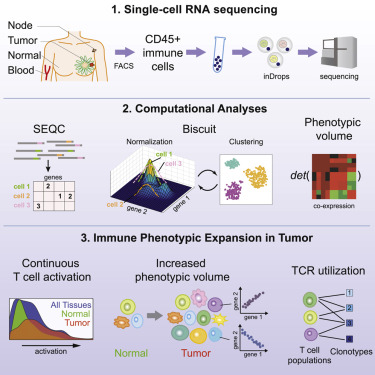

Fig 1: Workflow from the paper "Single-Cell Map of Diverse Immune Phenotypes in the Breast Tumor Microenvironment" ([Azizi et al., 2018](https://www.sciencedirect.com/science/article/pii/S0092867418307232?via%3Dihub))

**InDrop**

InDrop (Indexing Droplets) is a microfluidic technology used for high-throughput single-cell RNA sequencing. It allows for the encapsulation of individual cells within tiny droplets, where cell lysis and reverse transcription occur, capturing the mRNA from each cell. Each droplet is barcoded with a unique identifier, enabling the differentiation of RNA sequences from different cells. A critical feature of InDrop is the use of Unique Molecular Identifiers (UMIs), which are short, random nucleotide sequences added to each mRNA molecule during the reverse transcription process. UMIs help distinguish true biological signals from PCR amplification errors by allowing precise counting of the original number of mRNA molecules, thus enhancing the accuracy of gene expression measurements .

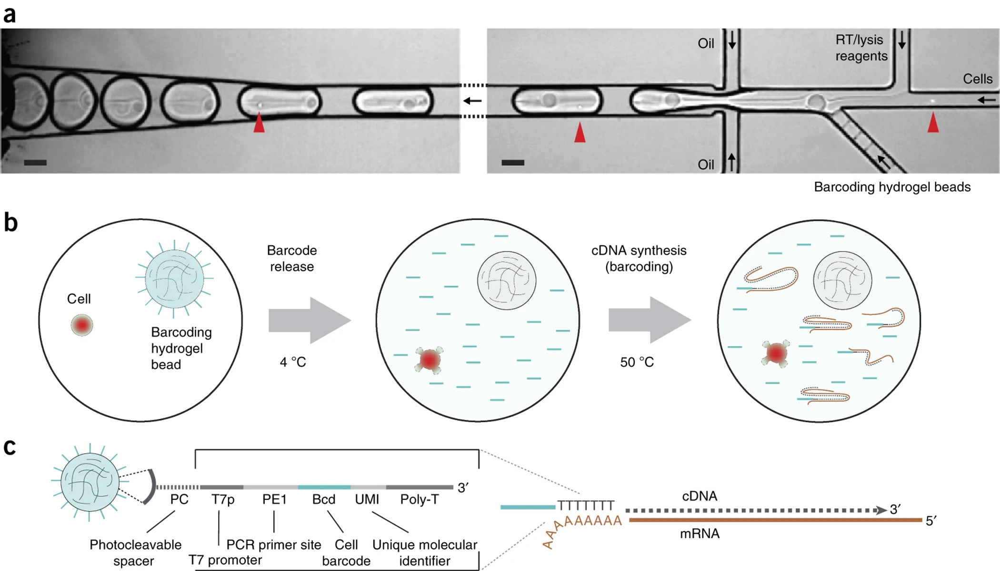

Fig 2: Scheme illustrating single-cell RNA-seq barcoding using inDrop: **(a)** Individual cells are co-encapsulated in microfluidic droplets along with hydrogel beads containing unique barcodes. **(b)** The barcoding process takes place after encapsulation. **(c)** The structure of the cDNA after synthesis and barcoding is shown.

Source: [Zilionis et al., 2016](https://www.nature.com/articles/nprot.2016.154)

We are going to start by download the dataset in RDS format and reading it using Seurat function ReadRDS:

In [ ]:
# downloading the dataset
url <- "https://figshare.com/ndownloader/files/49319047"
output_file <- "azizi.RDS"

download.file(url, output_file, mode = "wb")

The dataset it's already in the file format **.rds**, which is an R-specific file format used to store a single R object, such as a data frame, list, model, or other object types.


In [ ]:
seurat <- readRDS("/content/azizi.RDS")

print(seurat)

An object of class Seurat 
14601 features across 11562 samples within 1 assay 
Active assay: RNA (14601 features, 0 variable features)
 2 layers present: counts, data


In [ ]:
dims <- dim(seurat) # indicating the number of rows (genes) and columns (cells) in the matrix.
num_genes <- dims[1] # Extract the number of genes from the first element of the dimensions vector.
num_cells <- dims[2] # Extract the number of cells from the second element of the dimensions vector.

cat("The dataset contains", num_genes, "genes and", num_cells, "cells.\n") # Print the number of genes and cells to the console in a formatted string.

The dataset contains 14601 genes and 11562 cells.


In [ ]:
class(seurat) # Display the class of the 'seurat' object to understand its type.

[1] "Seurat"
attr(,"package")
[1] "SeuratObject"

In [ ]:
class(seurat@assays$RNA@counts) # Display the class of the matrix

[1] "dgCMatrix"
attr(,"package")
[1] "Matrix"

In [ ]:
class(seurat@meta.data) # Display the class of the metadata

[1] "data.frame"

In [ ]:
## Show the first 5 metadata rows
head(seurat@meta.data, 5)

,orig.ident,nCount_RNA,nFeature_RNA,patient,histologycal_subtype,grade,n_metastasis,molecular_subtype,age,menopause,BRCA_status,gender,study,tech,tumor_type,sample_type,tumor_site,condition,ident
,<fct>,<dbl>,<int>,<fct>,<fct>,<dbl>,<dbl>,<fct>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
barcode_1861,barcode,3602,823,Azizi_7,Ductal,3,0,HER2,65,Post,Unknown,F,Azizi et al,inDrop,breast,normal,NA,normal,barcode
barcode_1937,barcode,1664,540,Azizi_7,Ductal,3,0,HER2,65,Post,Unknown,F,Azizi et al,inDrop,breast,normal,NA,normal,barcode
barcode_1830,barcode,1693,465,Azizi_7,Ductal,3,0,HER2,65,Post,Unknown,F,Azizi et al,inDrop,breast,normal,NA,normal,barcode
barcode_1832,barcode,1878,706,Azizi_7,Ductal,3,0,HER2,65,Post,Unknown,F,Azizi et al,inDrop,breast,normal,NA,normal,barcode
barcode_1834,barcode,557,206,Azizi_7,Ductal,3,0,HER2,65,Post,Unknown,F,Azizi et al,inDrop,breast,normal,NA,normal,barcode


## **3. Quality Control**

Quality control is a crucial step in the processing of our single-cell data (Fig. 3). It is essentially used to remove low-quality cells, which, if retained, could alter subsequent analyses and reduce the reliability and biological representativeness of the dataset.

The first step of our quality control is to remove cells with less than 200 genes expressed and with fewer than 3 RNA counts.

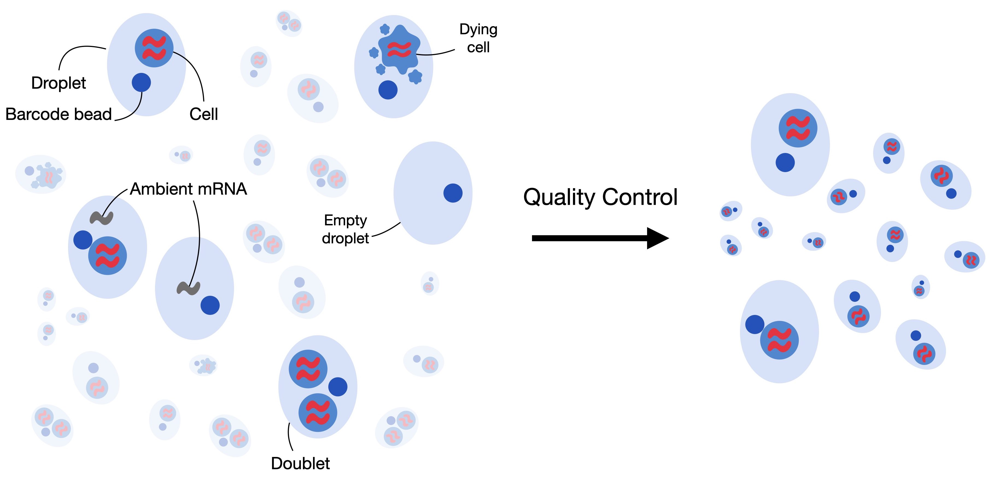

Fig 3: Quality control scheme. In this step we aim to keep only high quality data by removing gene expressing information from empty droplets, doublets, dying cells or cellular debris or possible contaminants (ambient mRNA) from our data. Source: [Heumos et al., 2023](https://www.nature.com/articles/s41576-023-00586-w)

In [ ]:
# Obtain dimensions of the original data matrix
original_dims <- dim(seurat)
# Extract the number of genes from the first element of the 'original_dims' vector.
original_genes <- original_dims[1]
# Extract the number of cells from the second element of the 'original_dims' vector.
original_cells <- original_dims[2]

In [ ]:
# Subset the 'seurat' object to keep cells with more than 200 detected features (genes) and more than 3 RNA counts.
seurat <- subset(seurat, subset = nFeature_RNA > 200 & nCount_RNA > 3)
seurat

An object of class Seurat 
14601 features across 10132 samples within 1 assay 
Active assay: RNA (14601 features, 0 variable features)
 2 layers present: counts, data

In [ ]:
# Obtain dimensions of the filtered Seurat object
seurat_dims <- dim(seurat)
filtered_genes <- seurat_dims[1]
filtered_cells <- seurat_dims[2]

# Calculate the number of removed genes and cells
removed_genes <- original_genes - filtered_genes
removed_cells <- original_cells - filtered_cells

# Print the results with improved formatting
cat(sprintf("The size of the original data matrix: %d genes and %d cells.\n", original_genes, original_cells))
cat(sprintf("The size of the Seurat object after filtering: %d genes and %d cells.\n", filtered_genes, filtered_cells))
cat(sprintf("Number of genes removed: %d\n", removed_genes))
cat(sprintf("Number of cells removed: %d\n", removed_cells))

The size of the original data matrix: 14601 genes and 11562 cells.
The size of the Seurat object after filtering: 14601 genes and 10132 cells.
Number of genes removed: 0
Number of cells removed: 1430


In [ ]:
## QC metrics for the first 5 cells
head(seurat@meta.data, 5)

,orig.ident,nCount_RNA,nFeature_RNA,patient,histologycal_subtype,grade,n_metastasis,molecular_subtype,age,menopause,BRCA_status,gender,study,tech,tumor_type,sample_type,tumor_site,condition,ident
,<fct>,<dbl>,<int>,<fct>,<fct>,<dbl>,<dbl>,<fct>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
barcode_1861,barcode,3602,823,Azizi_7,Ductal,3,0,HER2,65,Post,Unknown,F,Azizi et al,inDrop,breast,normal,NA,normal,barcode
barcode_1937,barcode,1664,540,Azizi_7,Ductal,3,0,HER2,65,Post,Unknown,F,Azizi et al,inDrop,breast,normal,NA,normal,barcode
barcode_1830,barcode,1693,465,Azizi_7,Ductal,3,0,HER2,65,Post,Unknown,F,Azizi et al,inDrop,breast,normal,NA,normal,barcode
barcode_1832,barcode,1878,706,Azizi_7,Ductal,3,0,HER2,65,Post,Unknown,F,Azizi et al,inDrop,breast,normal,NA,normal,barcode
barcode_1834,barcode,557,206,Azizi_7,Ductal,3,0,HER2,65,Post,Unknown,F,Azizi et al,inDrop,breast,normal,NA,normal,barcode



> We can visualize some metrics before de quality control filtering and compare them after quality control steps to see if our cutoffs are adequate.

We also need to decide which batch key to use. In this notebook we are going to use patient ID plus condition of the patient. That information will be important in many analysis steps, specially during integration for batch effect correction.


##**Mitochondrial content removal**

Mitochondrial genes are typically associated with cellular stress and apoptosis. Cells with elevated mitochondrial content are often damaged, dying, or undergoing stress, leading to aberrant gene expression patterns that can obscure biological signals of interest.

Here we use a cuttoff 10%, which cells with more than this percentage of mitochondrial genes are excluded[¹](https://doi.org/10.1093%2Fbioinformatics%2Fbtaa751).

Additionally, cells with abnormally low or high gene counts are removed. Low counts may suggest empty droplets or dying cells, while high counts may indicate doublets (two cells captured in a single droplet).

In [ ]:
# Calculate the percentage of mitochondrial gene expression for each cell and store it in the 'percent.mt' metadata of the 'seurat' object.
seurat[["percent.mt"]] <- PercentageFeatureSet(seurat, pattern = "^MT-")

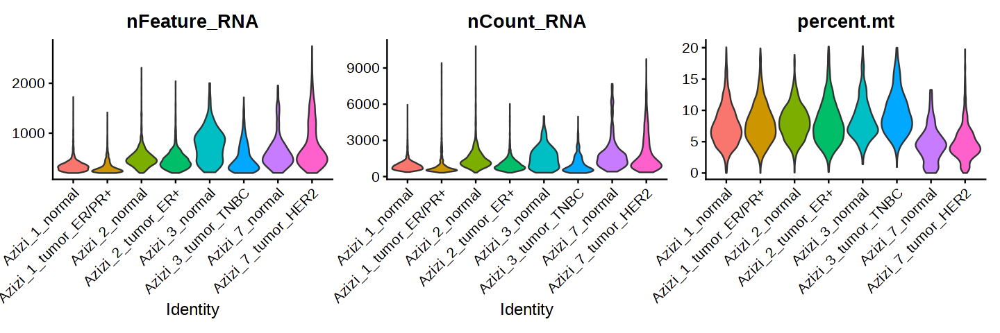

In [ ]:
options(repr.plot.width = 12, repr.plot.height = 4)

# joining patient and condition as batch key information.
seurat@meta.data <- seurat@meta.data %>% mutate(batch_key = paste(patient, condition, sep = "_"))
# Generate violin plots for the specified features ('nFeature_RNA', 'nCount_RNA', and 'percent.mt') and group the plots by the 'replicate' variable.
p1 <- VlnPlot(seurat, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), group.by = "batch_key", pt.size =0) + xlab("")
p1

## Outliers detection
Another important step is to identify and remove outlier cells based on their gene expression (nFeature_RNA) and transcript count (nCount_RNA). Cells with values above 1.5 times the interquartile range (IQR) from the third quartile (Q3) are considered outliers and are excluded from the dataset, ensuring a more accurate and reliable analysis.

First, we can visualize the distribution of gene counts (nCount_RNA) and feature counts (nFeature_RNA) to better understand potential outliers. We also add vertical lines to indicate the thresholds we will use for outlier detection.


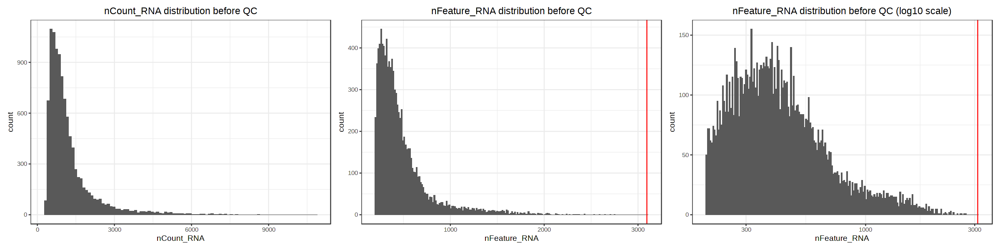

In [ ]:
# Increase figure size
options(repr.plot.width = 20, repr.plot.height = 5)  # Adjust width and height as needed

# Ensure metadata is properly defined as a data frame
metadata <- seurat@meta.data

# Original code to generate plots (p2, p3, p4)
p2 <- ggplot(metadata) +
  geom_histogram(aes(x = nCount_RNA), bins = 100) +
  ggtitle("nCount_RNA distribution before QC") +
  theme_bw()

p3 <- ggplot(metadata) +
  geom_histogram(aes(x = nFeature_RNA), bins = 200) +
  geom_vline(xintercept = 3096, color = "red") +
  ggtitle("nFeature_RNA distribution before QC") +
  theme_bw()

p4 <- ggplot(metadata) +
  geom_histogram(aes(x = nFeature_RNA), bins = 200) +
  geom_vline(xintercept = 10^(3.491), color = "red") +
  scale_x_log10() +
  ggtitle("nFeature_RNA distribution before QC (log10 scale)") +
  theme_bw()

# Combine plots with adjusted layout
p2 + p3 + p4 + plot_layout(ncol = 3, guides = "collect") &
  theme(plot.title = element_text(hjust = 0.5))  # Center plot titles

In [ ]:
# Function to calculate the upper limit for outlier detection using the Median Absolute Deviation (MAD)
# Args:
#   column: A numeric vector (e.g., log-transformed RNA counts)
#   k: A multiplier for the MAD (default = 5)
# Returns:
#   The upper limit beyond which values are considered outliers
is_outlier <- function(column, k = 5) {
  median_val <- median(column)  # Calculate the median of the column
  mad_val <- mad(column)        # Calculate the MAD (robust measure of dispersion)
  upper_limit <- median_val + k * mad_val  # Upper limit for outliers based on MAD
  return(upper_limit)            # Return the calculated upper limit
}

# Extract the unique patient batch identifiers from the metadata
# These batches will be used to split the Seurat object for processing
unique_batches <- unique(seurat@meta.data$batch_key)

# Initialize an empty list to store Seurat objects, each corresponding to a batch
split_seurat <- list()

# Function to calculate the upper limit for outlier detection in log-transformed RNA counts/features
# This simply wraps around the is_outlier function for convenience
calc_nmad_upper <- function(column) {
  return(is_outlier(column))  # Reuse is_outlier for upper limit calculation
}

# Loop over each unique batch of patients
for (i in seq_along(unique_batches)) {
  batch_value <- unique_batches[i]  # Get the batch value for the current iteration

  # Subset the Seurat object based on the current batch value
  # This creates a smaller Seurat object for patients belonging to the current batch
  seurat_batch <- subset(seurat, subset = batch_key == batch_value)

  # Calculate the upper limit for nCount_RNA and nFeature_RNA using MAD-based outlier detection
  # These limits are calculated on the log-transformed values
  nCount_upper <- calc_nmad_upper(log(seurat_batch@meta.data$nCount_RNA))
  nFeature_upper <- calc_nmad_upper(log(seurat_batch@meta.data$nFeature_RNA))

  # Use mutate to create new columns indicating whether each cell is an outlier
  # TRUE if the log-transformed value exceeds the calculated upper limit, FALSE otherwise
  seurat_batch@meta.data <- seurat_batch@meta.data %>%
    mutate(
      nCount_outlier_upper = ifelse(log(nCount_RNA) > nCount_upper, TRUE, FALSE),  # Check nCount outliers
      nFeature_outlier_upper = ifelse(log(nFeature_RNA) > nFeature_upper, TRUE, FALSE)  # Check nFeature outliers
    )

  # Store the processed batch-specific Seurat object in the split_seurat list
  split_seurat[[i]] <- seurat_batch
}

# Merge the list of batch-specific Seurat objects into one combined Seurat object
# This step reconstructs the Seurat object after processing each batch separately
seurat <- Reduce(merge, split_seurat)


In [ ]:
seurat_original <- seurat

# Store the number of columns (cells) in the Seurat object before filtering
before_filtering <- ncol(seurat_original)

# Create a new column 'quality' in the Seurat metadata based on outlier criteria and mitochondrial percentage
# Cells are marked as "Low-Quality" if:
#   1. nCount_RNA is flagged as an outlier
#   2. nFeature_RNA is flagged as an outlier
#   3. The percentage of mitochondrial RNA (percent.mt) is 10% or higher
# Otherwise, cells are labeled "High-Quality"
seurat_original$quality <- ifelse(
    seurat_original$nCount_outlier_upper == TRUE |     # Check if nCount_RNA is an outlier
    seurat_original$nFeature_outlier_upper == TRUE |         # Check if nFeature_RNA is an outlier
    seurat_original$percent.mt >= 10,                  # Check if mitochondrial RNA is above 10%
    "Low-Quality", "High-Quality"             # Assign "Low-Quality" or "High-Quality"
)

# Subset the Seurat object to retain only "High-Quality" cells based on the quality column
# This filters out the "Low-Quality" cells from the Seurat object
seurat <- subset(seurat_original, subset = quality == "High-Quality")

# Store the number of columns (cells) in the Seurat object after filtering
after_filtering <- ncol(seurat)

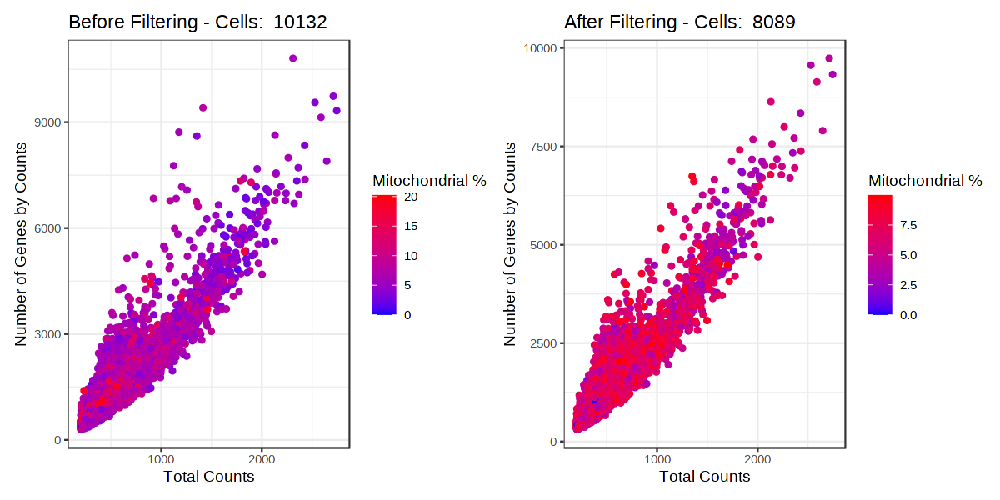

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 5)
# Scatter plot before filtering based on quality control
p5_before <- ggplot(seurat_original@meta.data, aes(x = nFeature_RNA, y = nCount_RNA, color = percent.mt)) +
  geom_point() +
  scale_color_gradient(low = "blue", high = "red") +
  labs(x = "Total Counts", y = "Number of Genes by Counts", color = "Mitochondrial %") +
  ggtitle(paste("Before Filtering - Cells: ", before_filtering)) +  # Title showing the number of cells before filtering
  theme_bw()

# Scatter plot after filtering based on quality control
p5_after <- ggplot(seurat@meta.data, aes(x = nFeature_RNA, y = nCount_RNA, color = percent.mt)) +
  geom_point() +
  scale_color_gradient(low = "blue", high = "red") +
  labs(x = "Total Counts", y = "Number of Genes by Counts", color = "Mitochondrial %") +
  ggtitle(paste("After Filtering - Cells: ", after_filtering)) +  # Title showing the number of cells after filtering
  theme_bw()

p5_before | p5_after  # Display both plots side by side

An object of class Seurat 
14601 features across 8089 samples within 1 assay 
Active assay: RNA (14601 features, 0 variable features)
 2 layers present: counts, data


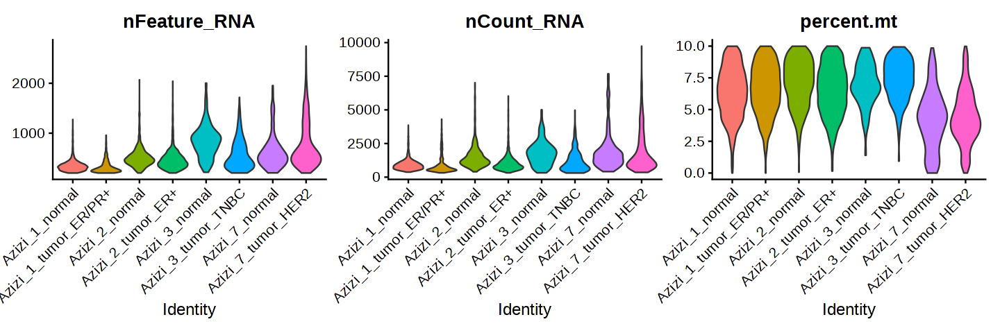

In [ ]:
options(repr.plot.width = 12, repr.plot.height = 4)

p6 <-
  VlnPlot(
    seurat,
    pt.size = 0,
    group.by = 'batch_key',
    features = c("nFeature_RNA", "nCount_RNA", "percent.mt"),
    ncol = 3
  )
p6
print(seurat)

## Doublets detection

In single-cell RNA sequencing, including inDrop and other droplet-based technologies, there's a possibility that some droplets may capture more than one cell, resulting in doublets. These doublets can distort downstream analyses by falsely increasing gene expression values. To prevent this bias and ensure our results are reliable, we use the scDblFinder tool, which detects and removes doublets [(Germain et al., 2022)](https://f1000research.com/articles/10-979/v2). Other tools, such as DoubletFinder [(McGinnis et al., 2019)](https://doi.org/10.1016/j.cels.2019.03.003), Scrublet [(Wolock et al., 2019)](https://www.sciencedirect.com/science/article/pii/S2405471218304745), and Solo [(Bernstein et al., 2020)](https://www.sciencedirect.com/science/article/pii/S2405471220301952), also perform this task, helping to ensure the accuracy and integrity of our single-cell dataset by filtering out these artifacts and preserving true biological variation.



In [ ]:
# Convert Seurat object to SingleCellExperiment object
sce <- as.SingleCellExperiment(seurat)
# Display the converted object
sce

# Run scDblFinder to identify doublets and convert results to a data frame
set.seed(123)
results <- scDblFinder(sce, returnType = 'table') %>%
  as.data.frame() %>%
  filter(type == 'real')
# Display the first few rows of the results
head(results)

# Count the number of doublets and singlets
counts <- results %>%
  dplyr::count(class)

class: SingleCellExperiment 
dim: 14601 8089 
metadata(0):
assays(2): counts logcounts
rownames(14601): A1BG A2M ... ZZEF1 ZZZ3
rowData names(0):
colnames(8089): barcode_1861 barcode_1937 ... barcode_56235
  barcode_56693
colData names(24): orig.ident nCount_RNA ... nFeature_outlier_upper
  quality
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

Creating ~6472 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 684 cells excluded from training.

iter=1, 1058 cells excluded from training.

iter=2, 1265 cells excluded from training.

Threshold found:0.518

952 (11.8%) doublets called



,type,weighted,distanceToNearest,distanceToNearestDoublet,distanceToNearestReal,nearestClass,ratio.k3,ratio.k10,ratio.k15,ratio.k20,⋯,ratio.k50,ratio.k64,lsizes,nfeatures,nAbove2,src,cxds_score,include.in.training,score,class
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<int>,<int>,<fct>,<dbl>,<lgl>,<dbl>,<chr>
barcode_1861,real,0.64574074,3.305234,3.305234,3.659993,artificialDoublet,0.6666667,0.7,0.73333333,0.65,⋯,0.54,0.625000,2744,421,229,real,0.69507787,FALSE,0.980186760,doublet
barcode_1937,real,0.52979167,3.209209,3.209209,5.327473,artificialDoublet,1.0000000,0.7,0.60000000,0.60,⋯,0.52,0.546875,1276,311,147,real,0.43085467,TRUE,0.177121297,singlet
barcode_1830,real,0.67249971,3.592775,3.592775,4.761599,artificialDoublet,0.6666667,0.6,0.60000000,0.65,⋯,0.66,0.703125,1272,273,134,real,0.46888090,FALSE,0.805582404,doublet
barcode_1832,real,0.86790428,4.146663,4.146663,4.609782,artificialDoublet,1.0000000,0.9,0.93333333,0.90,⋯,0.84,0.859375,1220,371,160,real,0.60485754,FALSE,0.997649014,doublet
barcode_1834,real,0.08579934,8.237534,8.683981,8.237534,cell,0.0000000,0.1,0.06666667,0.05,⋯,0.10,0.078125,381,135,50,real,0.08129795,TRUE,0.002090694,singlet
barcode_1847,real,0.77669960,3.625073,3.625073,4.102751,artificialDoublet,0.3333333,0.7,0.66666667,0.65,⋯,0.70,0.750000,2658,435,227,real,0.71540868,FALSE,0.997298300,doublet


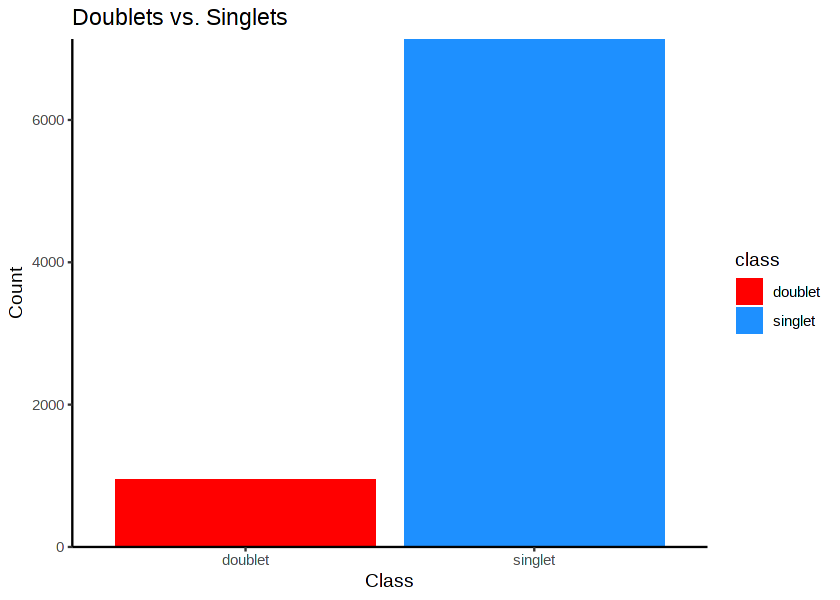

In [ ]:
options(repr.plot.width = 7, repr.plot.height = 5)
suppressWarnings(
  ggplot(counts, aes(x = class, y = n, fill = class)) + # Initializes ggplot with data and aesthetics
    geom_bar(stat = "identity") + # Creates bars with heights directly from the n values
    labs(title = "Doublets vs. Singlets", x = "Class", y = "Count") + # Adds title, x-axis, and y-axis labels
    scale_fill_manual(values = c("singlet" = "dodgerblue", "doublet" = "red")) + # Sets custom colors for each class
    theme_classic() +  # Applies a minimalist theme for a clean appearance
    scale_y_continuous(expand = c(0, 0))  # Adjusts the y-axis scale to remove extra padding
)

In [ ]:
# Filter rows in 'results' where 'class' is "singlet" and extract the row names to keep only those rows.
keep = results %>%
  dplyr::filter(class == "singlet") %>%
  rownames()
seurat = seurat[, keep]
seurat

An object of class Seurat 
14601 features across 7137 samples within 1 assay 
Active assay: RNA (14601 features, 0 variable features)
 2 layers present: counts, data

## **4. Normalization**

Normalization in single-cell RNA sequencing (scRNA-Seq) is a critical process to ensure accurate comparisons between cells. Since scRNA-Seq experiments often capture varying numbers of transcripts per cell due to differences in sequencing depth, library preparation, or RNA content, normalization adjusts for these technical variations. The goal is to make gene expression values comparable across cells, allowing researchers to focus on true biological differences. Various normalization methods exist, such as scaling total counts, log transformation, and model-based approaches, depending on the data type and downstream analysis.

**LogNormalize** is one of the most commonly used methods for UMI-based scRNA-Seq data, especially when simple yet effective normalization is needed. It works by normalizing gene expression to a common scale, typically 10,000 counts per cell, and applying a log transformation to reduce the impact of extreme values (highly expressed genes). This method is useful in early stages of analysis for tasks such as clustering, visualization, and differential expression analysis, as it balances data by correcting for sequencing depth and compresses the dynamic range of expression values, allowing for more meaningful comparisons across cells.

In [ ]:
# Update the Seurat object to the latest version.
seurat <- UpdateSeuratObject(seurat)

# Split the RNA assay data within the Seurat object based on the 'batch_key' column.
# This separates the RNA data into different subsets according to the batch key, which likely represents different experimental batches or samples.
# The split RNA data is stored back in the 'RNA' assay of the Seurat object.
seurat[["RNA"]] <- split(seurat[["RNA"]], f = seurat$batch_key)


Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Updating slots in RNA

Validating object structure for Assay ‘RNA’

Object representation is consistent with the most current Seurat version

Warning message:
“Input is a v3 assay and `split()` only works for v5 assays; converting
• to a v5 assay”
Warning message:
“Assay RNA changing from Assay to Assay5”


In [ ]:
# Normalize the 'seurat' data using the "LogNormalize" method with a scale factor of 10,000.
seurat <- NormalizeData(seurat, normalization.method = "LogNormalize", scale.factor = 10000)


# Display a subset (first 10 rows and first 10 columns) of the normalized RNA data from the 'seurat' object.
seurat[["RNA"]]$data[1:10,1:10]

Normalizing layer: counts.Azizi_7_normal

Normalizing layer: counts.Azizi_7_tumor_HER2

Normalizing layer: counts.Azizi_2_normal

Normalizing layer: counts.Azizi_2_tumor_ER+

Normalizing layer: counts.Azizi_3_normal

Normalizing layer: counts.Azizi_3_tumor_TNBC

Normalizing layer: counts.Azizi_1_normal

Normalizing layer: counts.Azizi_1_tumor_ER/PR+

Warning message in LayerData.Assay5(object = x, layer = i):
“multiple layers are identified by data.Azizi_7_normal data.Azizi_7_tumor_HER2 data.Azizi_2_normal data.Azizi_2_tumor_ER+ data.Azizi_3_normal data.Azizi_3_tumor_TNBC data.Azizi_1_normal data.Azizi_1_tumor_ER/PR+
 only the first layer is used”
  [[ suppressing 10 column names ‘barcode_1937’, ‘barcode_1834’, ‘barcode_1866’ ... ]]



10 x 10 sparse Matrix of class "dgCMatrix"
                                               
A1BG   .        . . 3.042240 . . . . .        .
A2M    .        . . .        . . . . .        .
A4GALT .        . . .        . . . . .        .
AAAS   .        . . .        . . . . .        .
AACS   .        . . .        . . . . .        .
AADAC  .        . . .        . . . . .        .
AADAT  .        . . .        . . . . .        .
AAED1  .        . . .        . . . . .        .
AAGAB  .        . . 2.195094 . . . . .        .
AAK1   1.947283 . . 3.364981 . . . . 2.766051 .

**Note:** scRNA-Seq data is highly sparse, meaning that the majority of gene expression values in the dataset are zeros. This sparsity arises because many genes are not detected in every cell, often due to the limited number of RNA molecules captured from each cell, dropouts (failure to detect transcripts), or biological factors such as differential gene expression. Sparse data can complicate downstream analyses, such as clustering and differential expression, as it may obscure true biological variation. Therefore, specialized computational tools and normalization techniques are often used to handle and interpret the sparsity effectively, ensuring robust analysis of the underlying biology.

After that we also scale our data so so the mean expression across cells is 0 and the variance is 1. The results will be stored in seurat[["RNA"]]@scale.data so we do not lose our raw counts values.

In [ ]:
# Extract all gene names (row names) from the 'seurat' object and store them in 'all.genes'.
all.genes <- rownames(seurat)
# Scale the data in the 'seurat' object for all genes listed in 'all.genes'.
seurat <- ScaleData(seurat, features = all.genes)

Centering and scaling data matrix



## **5. Feature Selection**

Feature selection is a critical step in analyzing scRNA-Seq data due to the high dimensionality and sparsity of the data (Fig 4). In scRNA-Seq experiments, tens of thousands of genes are typically measured across thousands of cells, but not all genes are equally informative for the biological question at hand. Many genes may be either ubiquitously expressed or have very low expression levels, contributing little to the variation between cell types or states.

Feature selection helps identify the most variable and biologically relevant genes, reducing noise and computational burden. By focusing on these highly variable genes (also called "highly variable features"), feature selection improves the sensitivity and accuracy of downstream analyses, such as clustering, dimensionality reduction, and differential expression. It ensures that the analysis captures the key patterns of gene expression variation, enhancing the ability to discern distinct cell populations and uncover meaningful biological insights.

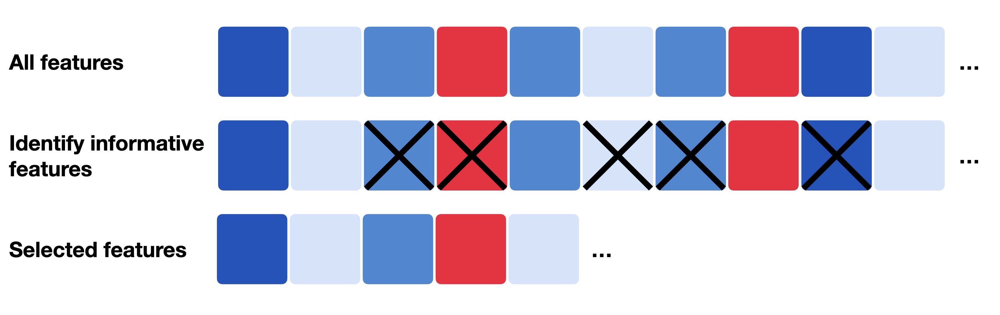

Fig 4: Feature selection generally describes the process of only selecting a subset of relevant features which can be the most informative, most variable or most deviant ones. Source: [Heumos et al., 2023](https://www.nature.com/articles/s41576-023-00586-w)

The FindVariableFeatures function is used to select the most variable genes using the "vst" (variance-stabilizing transformation) method.

In [ ]:
seurat <- FindVariableFeatures(seurat, selection.method = "vst", nfeatures = 2000)

# Extract the top 10 most variable features
top10 <- head(VariableFeatures(seurat), 10)

# Plot the variable features and label the top 10
p7 <- VariableFeaturePlot(seurat)

Finding variable features for layer counts.Azizi_7_normal

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -1.8482”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.30103”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  1.8643e-16”
Finding variable features for layer counts.Azizi_7_tumor_HER2

Finding variable features for layer counts.Azizi_2_normal

Finding variable features for layer counts.Azizi_2_tumor_ER+

Finding variable features for layer counts.Azizi_3_normal

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -2.2583”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.49734”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parame

Next, the top 10 most variable features are extracted and plotted using the VariableFeaturePlot function.

Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”


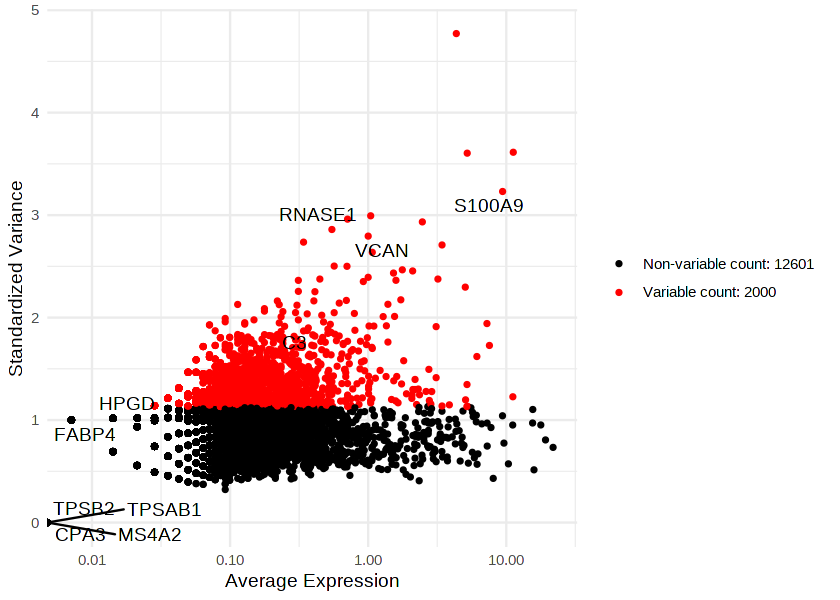

In [ ]:
options(repr.plot.width=7, repr.plot.height=5)
# Suppress warnings related to log-10 transformation
p8 <- suppressWarnings(
  LabelPoints(plot = p7, points = top10, repel = TRUE, xnudge = 0, ynudge = 0) +
    theme_minimal()  # Use a minimal theme for a cleaner look
)

# Display the plot
print(p8)

## **6. Integration and Dimensionality Reduction**

In single-cell data analysis, we often work with a large number of features, which can make it difficult to identify patterns and relationships. To simplify this, we use Principal Component Analysis (PCA), a technique for reducing the number of features while retaining the most critical information (Fig 5). PCA transforms the original features into 'principal components' (PCs), which are new variables that capture the maximum variance in the data. By focusing on the top PCs, we reduce the data’s complexity, making it easier to analyze without losing essential details.



We've identified highly variable genes and equalized the scale of different genes. Now let's do our first dimensionality reduction and visualization, PCA.

The explained variance by each principal component is the ratio between each eigenvalue and the sum of all eigenvalues. We need to remember that Seurat does not compute all the principal components, because it is computationally heavy. In our case, it calculated the first 50 PCs, so all the inference must be conditional on these 50 PCs (and not all the 3894 possible PCs).

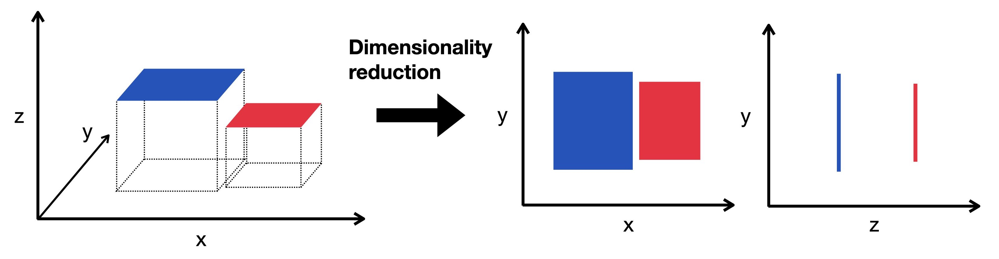

Fig 5: Dimensionality reduction embeds the high-dimensional data into a lower dimensional space. The low-dimensional representation still captures the underlying structure of the data while having as few as possible dimensions. Here we visualize a three dimensional object projected into two dimensions.

Source: [Heumos et al., 2023](https://www.nature.com/articles/s41576-023-00586-w)

In [ ]:
# Perform Principal Component Analysis (PCA) on the 'seurat' object using only the variable features.
# This reduces the dimensionality of the data and captures the most variance among the features.
seurat <- RunPCA(seurat, features = VariableFeatures(seurat))

PC_ 1 
Positive:  IL7R, CCL5, TRBC2, MALAT1, SPOCK2, KLRB1, PIK3IP1, CD8A, RPLP1, CD69 
	   CD7, KLRD1, CD6, CD247, AC092580.4, PRF1, CCL4, IL2RB, GZMA, NKG7 
	   LTB, FAM102A, XCL1, CTSW, GNLY, ITGA1, ZNF683, MIAT, ITM2A, PRKCH 
Negative:  CST3, HLA-DRA, LYZ, HLA-DRB1, GRN, HLA-DPA1, CD68, HLA-DRB5, TYROBP, HLA-DPB1 
	   CEBPD, CD74, PSAP, HLA-DQB1, HLA-DQA1, GPX1, MAFB, MS4A6A, SPI1, CD14 
	   CXCL16, CSF1R, KCTD12, NPC2, SGK1, AIF1, FCGR2A, CTSB, KLF4, HLA-DMA 
PC_ 2 
Positive:  MS4A2, TPSB2, TPSAB1, CPA3, GATA2, SLC18A2, KIT, SLC45A3, VWA5A, HDC 
	   IL1RL1, HPGDS, LIF, MAOB, HPGD, KRT1, CLU, CTSG, ADCYAP1, ITGA2B 
	   BACE2, CSF1, CALB2, HS6ST1, TSC22D1, RGS13, SAMSN1, LMO4, AC004791.2, PTGS2 
Negative:  C1QA, C1QB, HLA-DQA1, C1QC, HLA-DPB1, HLA-DPA1, HLA-DRB1, MS4A6A, CSF1R, HLA-DRA 
	   PDK4, A2M, MAFB, HLA-DQB1, MS4A7, HLA-DMA, SEPP1, HLA-DMB, KCTD12, MRC1 
	   DAB2, CST3, VSIG4, CD74, HLA-DOA, CD163, F13A1, SLCO2B1, CTSH, MSR1 
PC_ 3 
Positive:  MS4A2, TPSB2, CPA3, SLC18A2, TP

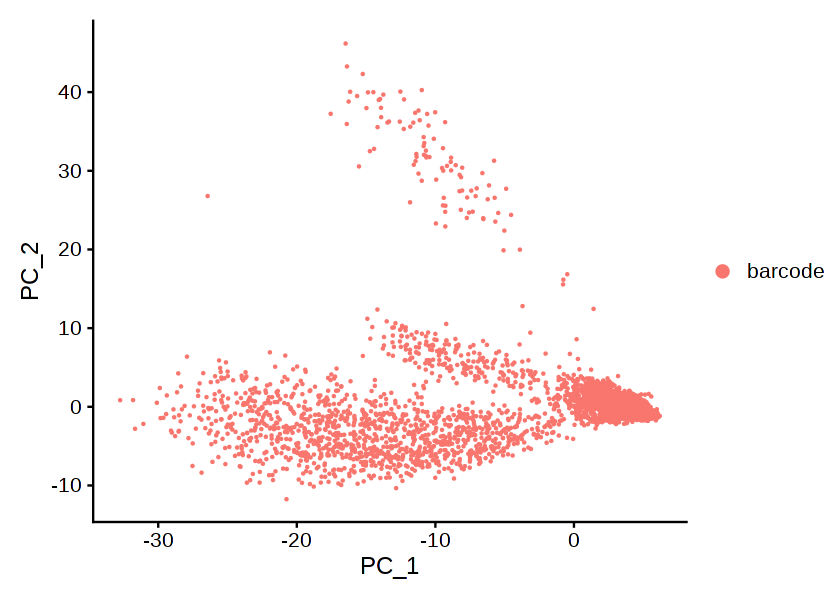

In [ ]:
options(repr.plot.width=7, repr.plot.height=5)
# Create a scatter plot of the cells based on their PCA coordinates.
p9 <- DimPlot(seurat, reduction = "pca")
p9

Next, we create a data frame that includes both the percentage of variance explained by each principal component and the cumulative percentage of explained variance. This data frame will help us to better understand how much each principal component contributes to the overall variability in the dataset and how this contribution accumulates with additional components.

The script then displays the first 20 rows of this data frame, providing a preview of the variance information.

,PC,percVar,cumulVar
,<fct>,<dbl>,<dbl>
1,1,3.8008111,3.800811
2,2,1.1897932,4.990604
3,3,1.0803024,6.070907
4,4,0.6069350,6.677842
5,5,0.5228406,7.200682
6,6,0.4283366,7.629019
7,7,0.3767199,8.005739
8,8,0.3341572,8.339896
9,9,0.2988069,8.638703


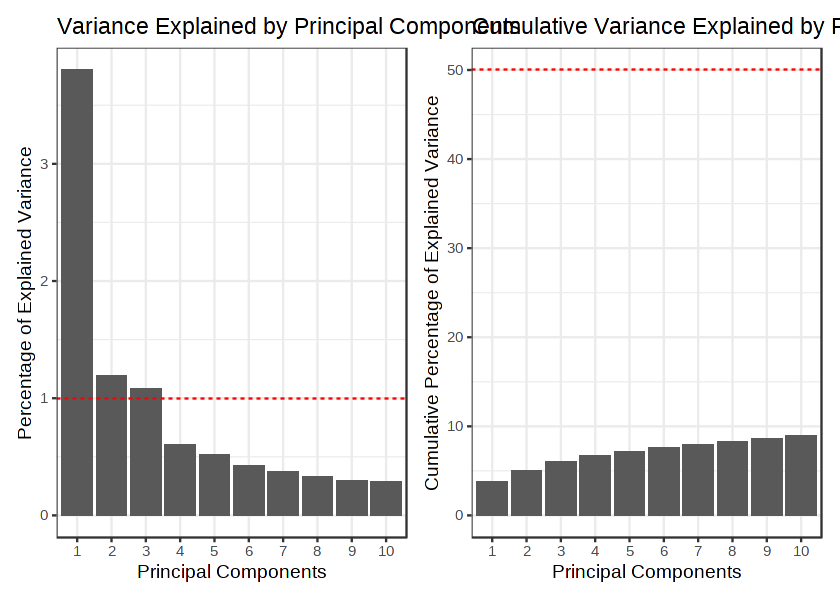

In [ ]:
options(repr.plot.width=7, repr.plot.height=5)
# Extract PCA results
pca <- seurat[["pca"]]

# Calculate eigenvalues and total variance
evs <- pca@stdev^2
total.var <- pca@misc$total.variance

# Calculate the percentage of variance explained by each principal component
varExplained <- evs / total.var

# Create a data frame with percentage variance and cumulative variance
pca.data <- data.frame(PC = factor(1:length(evs)),
                      percVar = varExplained * 100)
pca.data$cumulVar = cumsum(pca.data$percVar)

# Display the first 20 rows of the data frame
head(pca.data, 20)

# Plot the variance explained by the first 10 principal components
p10 <- ggplot(pca.data[1:10,], aes(x = PC, y = percVar)) +
           geom_col() +  # Use geom_col for a more direct bar plot
           geom_hline(yintercept = 1, colour = "red", linetype = "dashed") +
           labs(title = "Variance Explained by Principal Components",
                x = "Principal Components",
                y = "Percentage of Explained Variance") +
           theme_bw()

# Plot cumulative variance explained by the first 10 principal components
p11 <- ggplot(pca.data[1:10,], aes(x = PC, y = cumulVar)) +
           geom_col() +  # Use geom_col for a more direct bar plot
           geom_hline(yintercept = 50, colour = "red", linetype = "dashed") +
           labs(title = "Cumulative Variance Explained by Principal Components",
                x = "Principal Components",
                y = "Cumulative Percentage of Explained Variance") +
           theme_bw()

# Display the plots
p10 | p11

We can also visualize our PCs in heatmaps

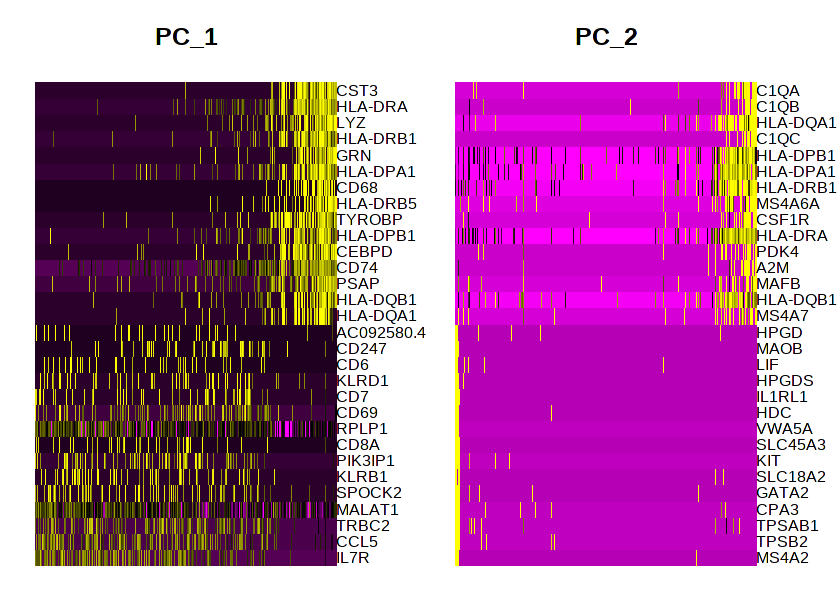

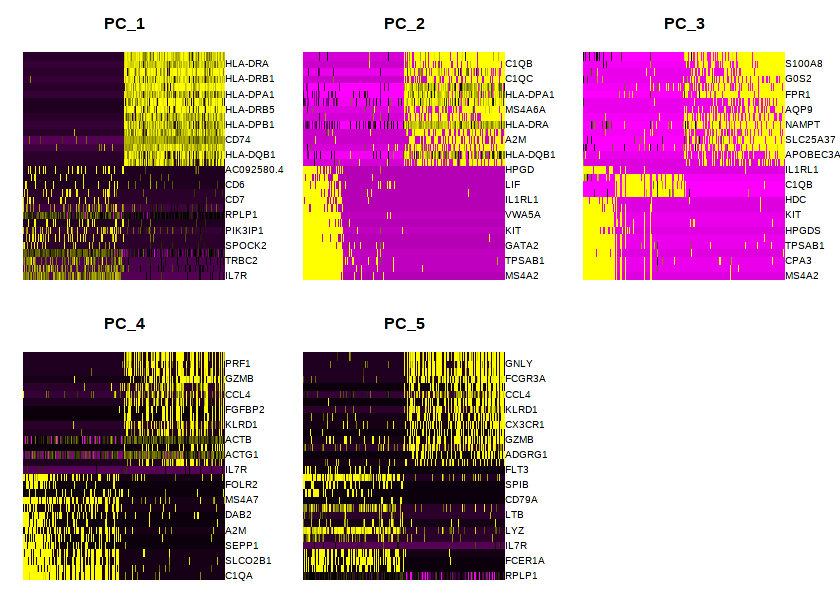

In [ ]:
options(repr.plot.width=7, repr.plot.height=5)
# Heatmap of PCs 1 and 2: Visualizes the top two principal components (PCs) to assess patterns.
DimHeatmap(seurat, dims = 1:2)

# Heatmap of PCs 1 to 5 (500 cells): Displays the first five PCs across 500 cells, with balanced scaling.
DimHeatmap(seurat, dims = 1:5, cells = 500, balanced = TRUE)

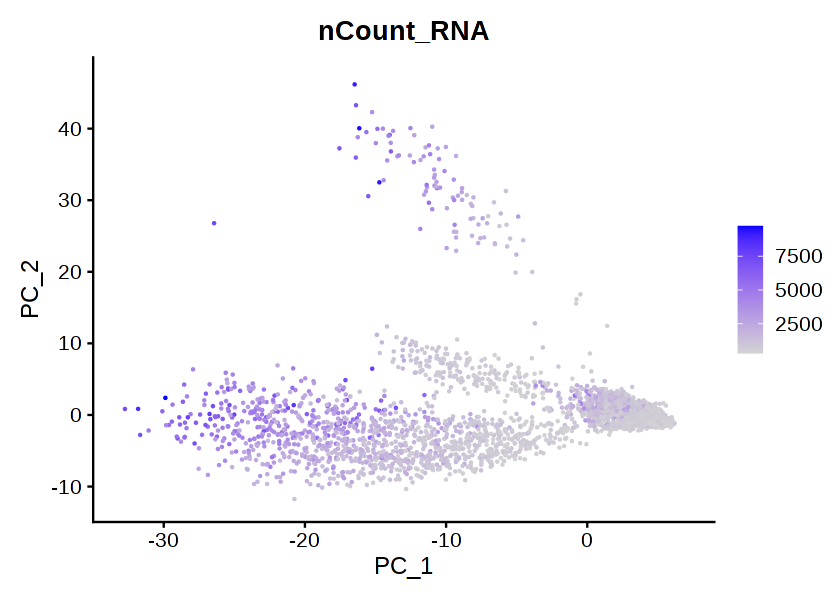

In [ ]:
options(repr.plot.width=7, repr.plot.height=5)
# Feature Plot of nCount_RNA: Shows the expression distribution of the RNA count across the dataset.
p12 <- FeaturePlot(seurat, features = "nCount_RNA")
p12

The elbow plot is used to visually determine the optimal number of PCs to retain for further analysis by showing where the variance explained by additional PCs levels off. The "elbow" in the plot indicates a point beyond which adding more PCs yields diminishing returns in explained variance, helping to select a suitable number of PCs for subsequent analysis.

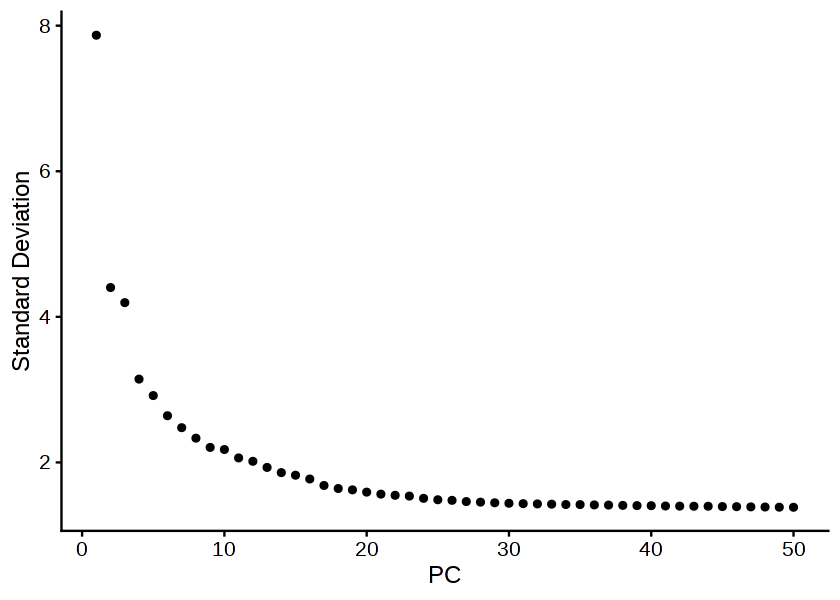

In [ ]:
# Elbow Plot (50 PCs): Helps to determine the optimal number of principal components for further analysis.
p13 <- ElbowPlot(seurat, ndims = 50)
p13

In [ ]:
# Extract the standard deviations of the principal components (PCs) from the PCA object in 'seurat_object'.
stdv <- seurat[["pca"]]@stdev
# Calculate the total sum of the standard deviations of all PCs.
sum_stdv <- sum(seurat[["pca"]]@stdev)
# Compute the percentage variance explained by each PC.
percent_stdv <- (stdv / sum_stdv) * 100
# Calculate the cumulative sum of the variance explained by the PCs.
cumulative <- cumsum(percent_stdv)
# Identify the first PC that explains more than 90% of the cumulative variance and has less than 5% individual variance.
co1 <- which(cumulative > 90 & percent_stdv < 5)[1]
# Find the PC index where the difference between the consecutive PCs' variance drops more than 0.1, indicating diminishing returns.
co2 <- sort(which((percent_stdv[1:length(percent_stdv) - 1] -
                   percent_stdv[2:length(percent_stdv)]) > 0.1),
            decreasing = TRUE)[1] + 1
# Determine the minimum number of PCs to retain for downstream analysis.
min_pc <- min(co1, co2)

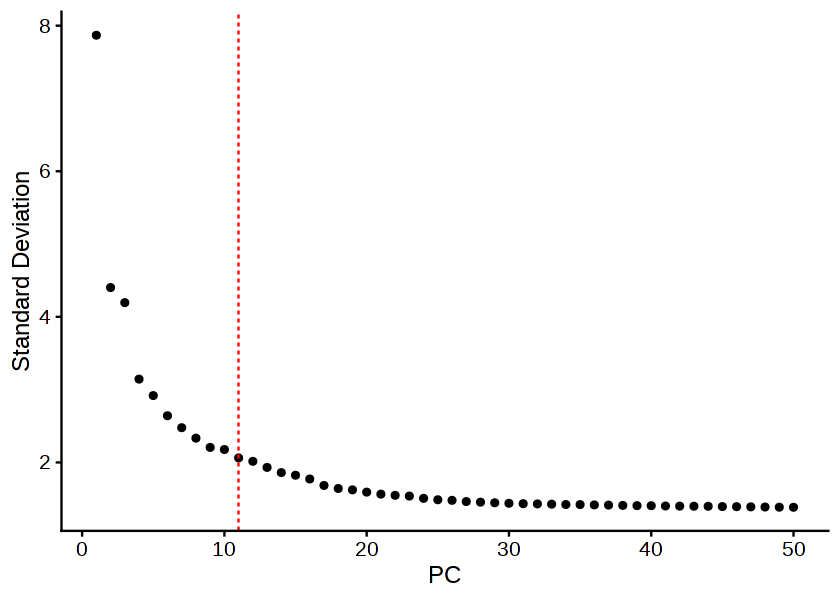

In [ ]:
# Add a horizontal line to the plot 'p13' at the position of 'min_pc' (the chosen number of PCs) with a dashed line (linetype 2) and color it red.
p13 + geom_vline(xintercept = min_pc, linetype = 2, colour = "red")

Now we can run the UMAP using the principal components (PCs) from 1 to min_pc, which was previously determined as the optimal number of PCs based on explained variance.

###Batch effect
A central challenge in most scRNA-seq data analyses is presented by batch effects. Batch effects are changes in measured expression levels that are the result of handling cells in distinct groups or “batches”. For example, a batch effect can arise if two labs have taken samples from the same cohort, but these samples are dissociated differently.

###Batch effect removal:
Some batch effect sources might be technical such as differences in sample handling, experimental protocols, or sequencing depths, but biological effects such as donor variation, tissue, or sampling location are also often interpreted as a batch effect. Whether or not biological factors should be considered batch effects can depend on the experimental design and the question being asked. Removing batch effects is crucial to enable joint analysis that can focus on finding common structure in the data across batches and enable us to perform queries across datasets.

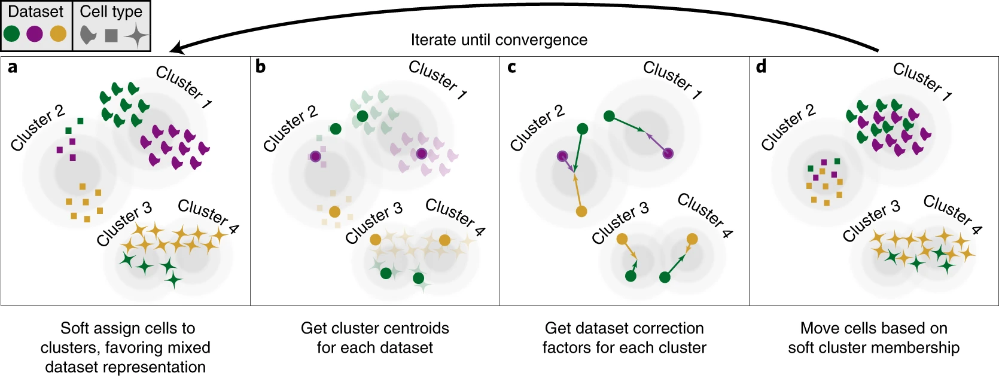

In [ ]:
options(future.globals.maxSize = 3e+09)

In [ ]:
seurat <- IntegrateLayers(
  object = seurat, method = HarmonyIntegration,
  orig.reduction = "pca", new.reduction = "harmony",
  verbose = FALSE
)

Warning message in harmony::HarmonyMatrix(data_mat = Embeddings(object = orig), :
“HarmonyMatrix is deprecated and will be removed in the future from the API in the future”
Warning message:
“Warning: The parameters do_pca and npcs are deprecated. They will be ignored for this function call and please remove parameters do_pca and npcs and pass to harmony cell_embeddings directly.
This warning is displayed once per session.”
Warning message:
“Warning: The parameter tau is deprecated. It will be ignored for this function call and please remove parameter tau in future function calls. Advanced users can set value of parameter tau by using parameter .options and function harmony_options().
This warning is displayed once per session.”
Warning message:
“Warning: The parameter block.size is deprecated. It will be ignored for this function call and please remove parameter block.size in future function calls. Advanced users can set value of parameter block.size by using parameter .options and fun

In [ ]:
# Find the nearest neighbors for each cell based on the first 'min_pc' principal components
# The `FindNeighbors` function in Seurat is used to construct a nearest-neighbor graph based on the similarities between cells in a single-cell RNA sequencing dataset.
#Input: It typically takes a lower-dimensional representation of the data, such as principal component analysis (PCA) or other dimensionality reduction outputs (e.g., UMAP, t-SNE), to compute the distance or similarity between cells.
#Output: It creates a K-nearest neighbor (KNN) graph, where each cell is connected to its k most similar cells. The similarity between cells is calculated based on the Euclidean distance or other distance metrics in the reduced-dimensional space.
seurat <- FindNeighbors(
  object = seurat,         # Seurat object containing the single-cell RNA-seq data.
  dims = 1:min_pc,         # The number of dimensions (PCs) used to calculate cell similarities.

  # Optional parameters:
  reduction = "harmony",       # Specifies which dimensionality reduction to use (e.g., "pca", "umap", "tsne").
  k.param = 20,            # The number of nearest neighbors (k) to compute for each cell (default is 20).
  prune.SNN = 1/15,        # Prune weak edges in the shared nearest neighbor (SNN) graph (default is 1/15).
  nn.method = "annoy",     # Method for nearest neighbor search; options are "rann" (default) or "annoy".
  annoy.metric = "euclidean", # Distance metric used when using the 'annoy' method (options: "euclidean", "cosine", "manhattan").
  n.trees = 50,            # The number of trees to build for the 'annoy' method (default is 50).
  force.recalc = FALSE     # Whether to force recalculation of nearest neighbors if they have already been computed (default is FALSE).
)

Warning message:
“The following arguments are not used: force.recalc”
Warning message:
“The following arguments are not used: force.recalc”
Computing nearest neighbor graph

Computing SNN



In [ ]:
# Run UMAP using the selected number of PCs from 1 to 'min_pc' for dimensionality reduction and visualization
seurat <- RunUMAP(seurat, dims = 1:min_pc, verbose = FALSE)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


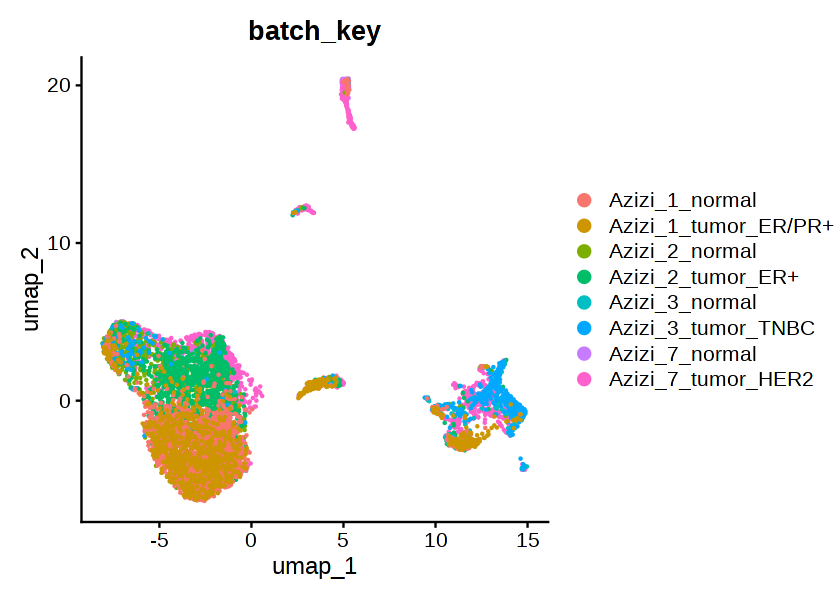

In [ ]:
options(repr.plot.width=7, repr.plot.height=5)
# UMAP Plot with Labels
p14 <- DimPlot(seurat, group.by = "batch_key", label = FALSE)
p14

Warning message in CombinePlots(plots):
“CombinePlots is being deprecated. Plots should now be combined using the patchwork system.”


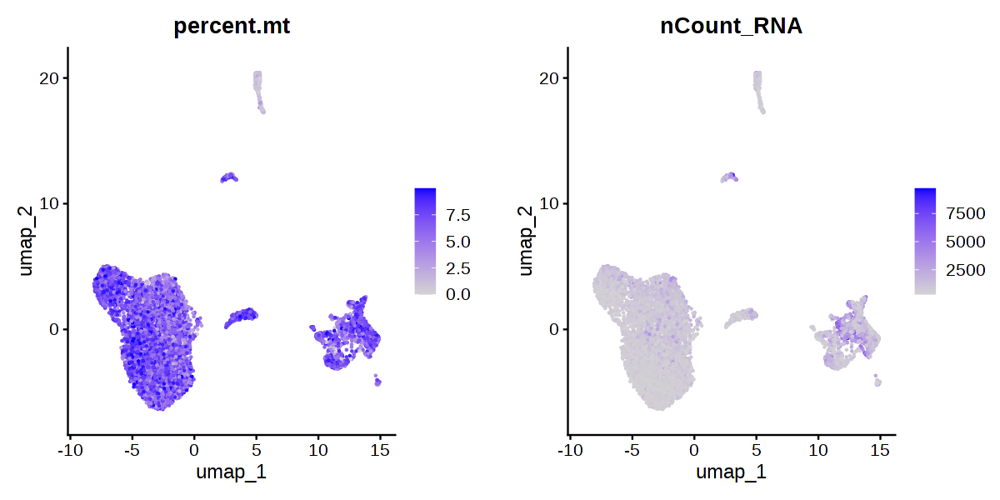

In [ ]:
options(repr.plot.width=10, repr.plot.height=5)
# List of features to plot
features <- c("percent.mt", "nCount_RNA")

# Create a list to store the plots
plots <- list()

# Generate and store plots in the list
for (feature in features) {
  plot <- FeaturePlot(seurat, features = feature)
  plots[[feature]] <- plot
}
#plot
combined_plot <- CombinePlots(plots)
combined_plot



---



---

```

## **7. Clustering**

Based on the previous steps of dimensionality reduction and identification of variable genes, we can now assign each cell to clusters by calculating the similarity between neighbors—specifically, the similarity in gene expression that each cell presents. It's important to note that the number of clusters won't always be fixed; this can be adjusted by tweaking the resolution parameter. Higher resolution typically results in more clusters.

**Important:** Higher resolutions do not always yield better representations of the data. Depending on the focus of the study, this approach can lead to over-segmentation, splitting clusters that should remain unified. It’s also worth noting that the number of clusters may plateau beyond a certain resolution, indicating that further increases in resolution don’t produce more meaningful distinctions.

Clustering is an unsupervised machine learning task where clusters are formed by minimizing distances within clusters in a reduced expression space, typically using principal component analysis (PCA) and Euclidean distance for similarity scoring.

In a KNN (k-nearest neighbors) graph, cells are nodes connected to their K most similar cells based on Euclidean distance in the PCA-reduced space. The value of K ranges from 5 to 100, depending on the dataset size. This graph shows dense regions of similar cells as densely connected clusters (Fig. 6).

The Leiden algorithm, an improved version of the Louvain algorithm, is preferred for clustering single-cell RNA-seq data due to its superior performance and maintenance status. Leiden detects clusters by evaluating the number of connections within clusters relative to the expected number across the dataset.

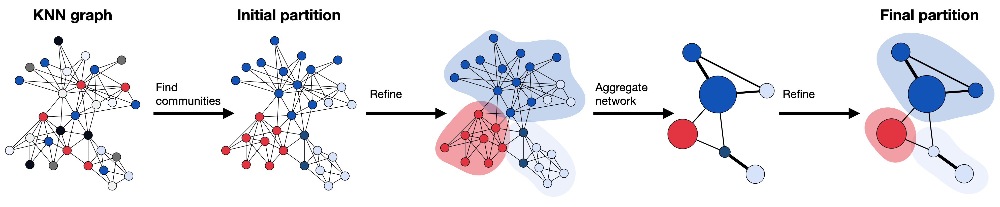

Fig 6: The Leiden algorithm computes a clustering on a KNN graph obtained from the PC reduced expression space. It starts with an initial partition where each node from its own community. Next, the algorithm moves single nodes from one community to another to find a partition, which is then refined. Based on a refined partition an aggregate network is generated, which is again refined until no further improvements can be obtained, and the final partition is reached.
 Source: [Heumos et al., 2023](https://www.nature.com/articles/s41576-023-00586-w)

In [ ]:
# Perform clustering of cells based on the nearest neighbors, using a resolution of 0.5
seurat <- FindClusters(seurat, resolution = 0.7)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7137
Number of edges: 238609

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8366
Number of communities: 14
Elapsed time: 1 seconds


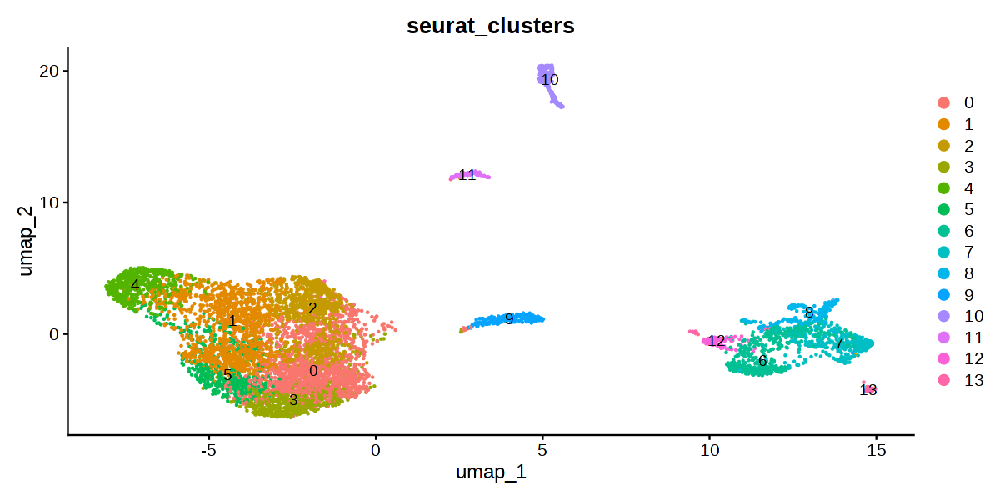

In [ ]:
# Plot the UMAP projection of the cells
DimPlot(seurat, reduction = "umap", group.by = "seurat_clusters", label = TRUE)

## **8. Differential Gene Expression**

Now that we have our clusters formed, we can observe which genes are differentially expressed (DEGs) between clusters and/or different conditions, identifying those that are up or downregulated, thus providing biological identity to the cluster. This type of analysis in single-cell data is also fundamental for identifying marker genes that are enriched in a specific cluster.

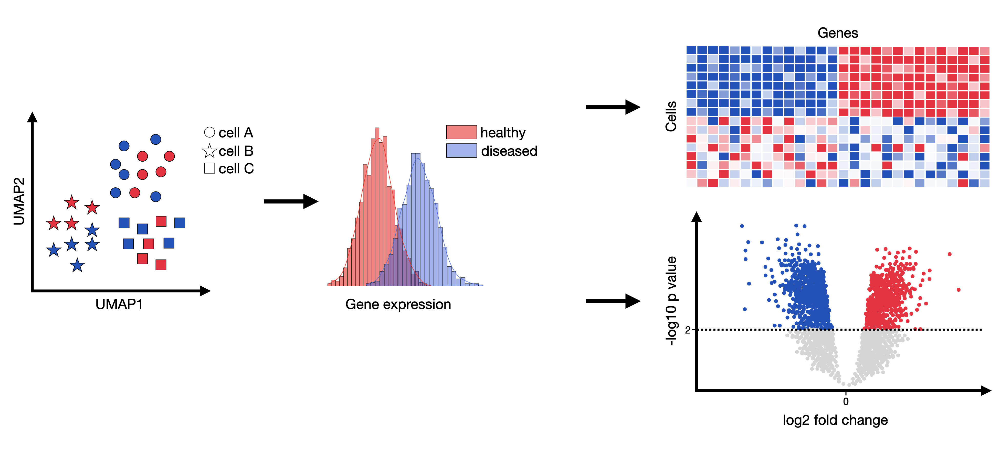

Fig 7: Differential gene expression analysis attempts to infer genes that are statistically significantly over- or underexpressed between any compared groups (commonly between healthy and condition per cell type). Source: [Heumos et al., 2023](https://www.nature.com/articles/s41576-023-00586-w)

The `FindAllMarkers` function in Seurat is used to identify differentially expressed genes (markers) across different cell clusters in single-cell RNA sequencing (scRNA-Seq) data. This function compares gene expression between clusters and finds genes that are significantly more highly expressed in one cluster relative to the others, which can help define and characterize the unique identity of each cell population.

`FindAllMarkers` performs pairwise comparisons of clusters using statistical tests such as the **Wilcoxon rank-sum test**, and it outputs a list of genes that are differentially expressed in each cluster. The Wilcoxon rank sum test, a non-parametric statistical test, is used by default. This test compares the distributions of gene expression levels between two groups (e.g., one cluster versus all other clusters) without assuming a normal distribution of the data.

By default, Seurat applies the **Benjamini-Hochberg** procedure to adjust p-values for multiple comparisons. This method controls the false discovery rate (FDR), which is the expected proportion of false positives among the declared significant results. Adjusted p-values (p_val_adj) are used to determine the statistical significance of DEGs, reducing the likelihood of identifying false positives due to the large number of tests performed.

In [ ]:
seurat <- JoinLayers(seurat)

In [ ]:
# Identify differentially expressed genes (DEGs) for each cluster using FindAllMarkers.
deg <- FindAllMarkers(object = seurat,
                      only.pos = TRUE, #Select only genes that are upregulated in each cluster.
                      test.use = "wilcox", #Use the Wilcoxon rank sum test for differential expression.
                      logfc.threshold = 0.25, #Only test genes with a minimum log-fold change of 0.25.
                      min.pct = 0.1, #Only test genes expressed in at least 10% of cells in either cluster.
                      pseudocount.use = 1) #Add a pseudocount to avoid issues with log transformation.

# The FindAllMarkers function by default applies the Wilcoxon rank sum test to identify DEGs.
# It also performs multiple testing correction using the Benjamini-Hochberg (FDR) method.
# Seurat automatically adjusts p-values to control the false discovery rate.

# Subset the DEGs to include only those with an adjusted p-value (FDR) less than or equal to 0.05,
# indicating statistical significance after multiple testing correction.
deg_filtered <- subset(deg, subset = p_val_adj <= 0.05)


Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13



In [ ]:
# Group the DEGs by cluster and select the top 5 genes with the highest average log2 fold change (avg_log2FC)
# for each cluster. This identifies the most significantly upregulated genes within each cluster.
deg_filtered %>%
  group_by(cluster) %>%
  top_n(n = 5, wt = avg_log2FC) -> top5
top5

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
1.562265e-142,1.1875712,0.689,0.342,2.281063e-138,0,IL7R
1.822102e-40,1.5665191,0.171,0.064,2.660451e-36,0,CD40LG
1.970580e-31,1.0466152,0.286,0.162,2.877244e-27,0,LTB
5.402177e-30,1.1918364,0.202,0.098,7.887718e-26,0,TCF7
7.040778e-19,1.4294404,0.102,0.044,1.028024e-14,0,CCR6
1.537454e-214,2.4562396,0.428,0.084,2.244837e-210,1,CD8A
6.367613e-142,2.8291468,0.237,0.034,9.297352e-138,1,XCL1
2.784833e-116,2.7336904,0.198,0.029,4.066135e-112,1,XCL2
3.525790e-101,2.4604247,0.224,0.046,5.148005e-97,1,GZMK


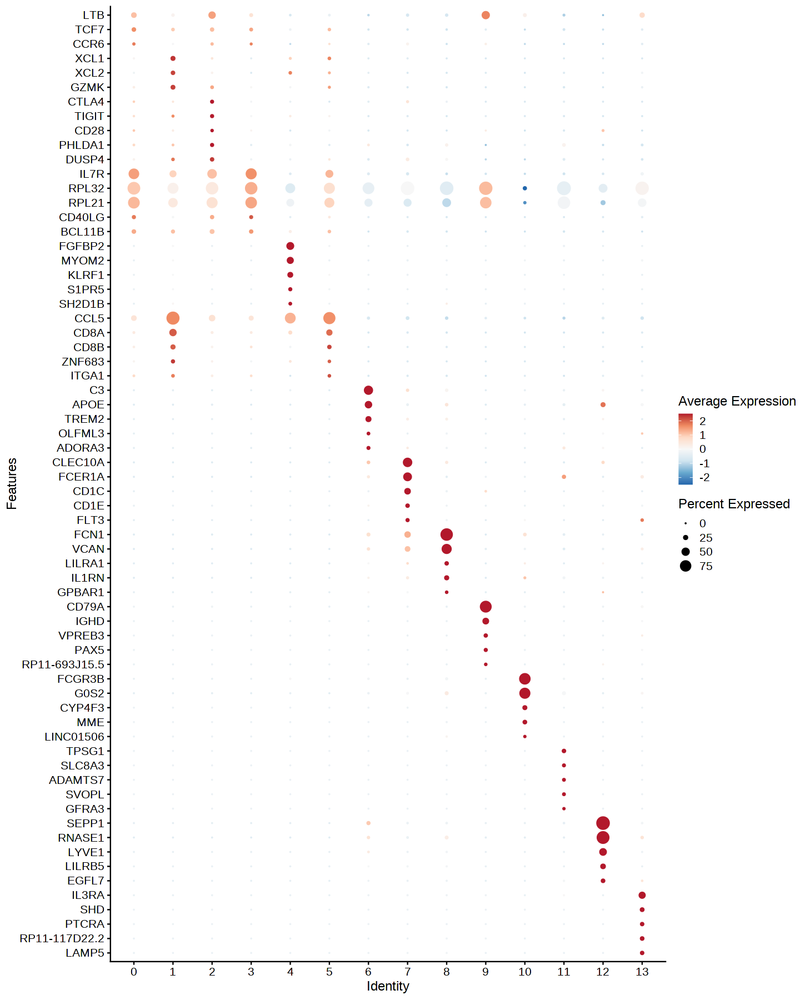

In [ ]:
# Create a dot plot to visualize the expression levels of the top 5 upregulated genes for each cluster.
# The features parameter specifies which genes to include in the plot, using the unique gene names from 'top5'.
# The 'group.by' parameter specifies the clustering resolution (e.g., 'leiden_0.7') to group cells in the plot.
# 'cols' sets the color palette for the plot, in this case, "RdBu" is used.
# 'coord_flip()' flips the x and y coordinates to better visualize gene expression across clusters.
options(repr.plot.width=12, repr.plot.height=15)
p15 <- DotPlot(
  seurat,
  features = unique(rev(top5$gene)),  # List of top 5 genes to display
  group.by = 'seurat_clusters',             # Clustering resolution for grouping
  cols = "RdBu"                        # Color palette
) + coord_flip()                        # Flip coordinates for better visualization
p15

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


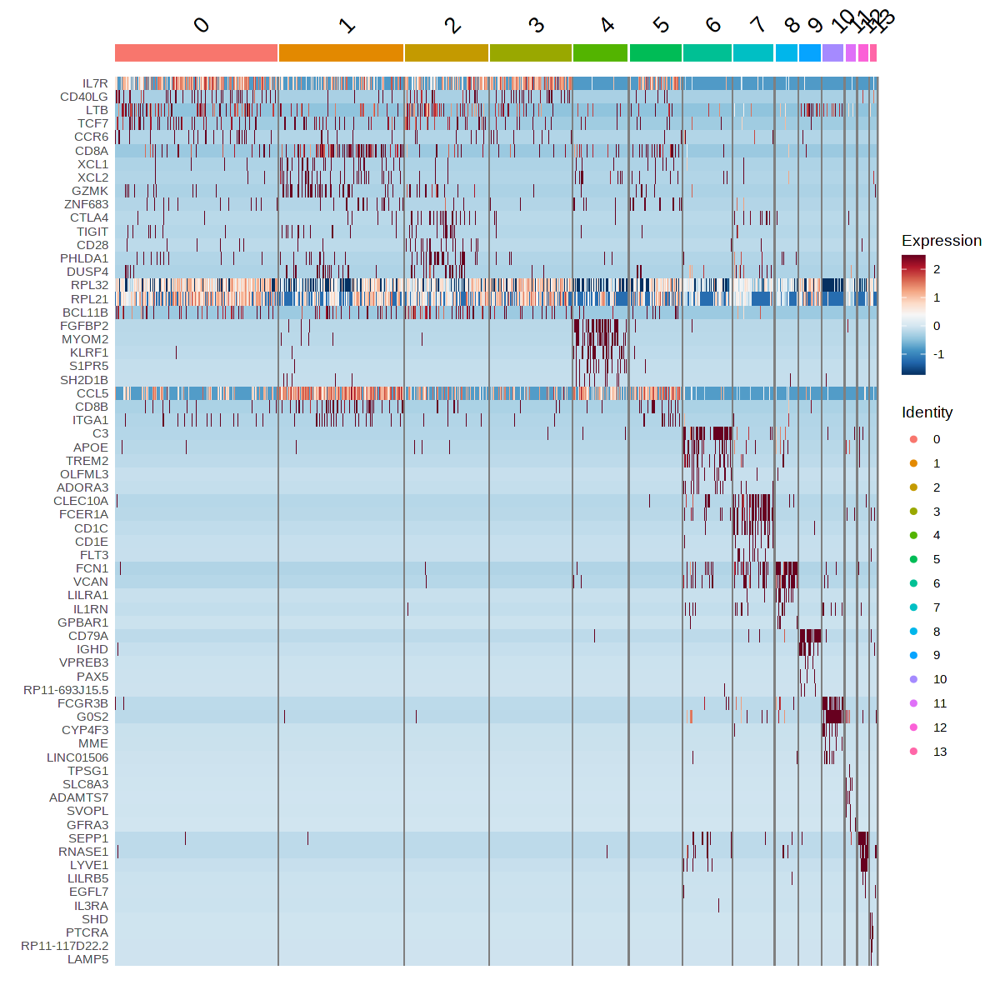

In [ ]:
options(repr.plot.width=10, repr.plot.height=10)
mapal <- colorRampPalette(RColorBrewer::brewer.pal(11,"RdBu"))(256)
# Create a heatmap to visualize the expression levels of the top 5 upregulated genes across different clusters.
p16 <- DoHeatmap(seurat, features = top5$gene) + scale_fill_gradientn(colours = rev(mapal))
p16

## **9. Referece Mapping**

A common approach in single-cell analysis is reference-based cell annotation, where clusters are annotated using a well-annotated dataset as a reference. In this case, the SingleR package is used to carry out this step, where the gene expression profiles of the target dataset are compared to those of the reference dataset. By aligning the expression profiles, we can assign cell type labels to the clusters based on the reference data, ensuring more accurate biological interpretation of the results.

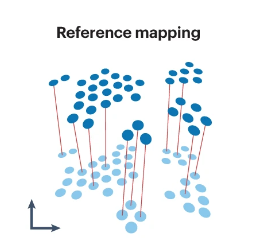

In [ ]:
# Load the Blueprint and ENCODE reference dataset, which contains pre-annotated cell types.
ref <- BlueprintEncodeData()
ref

Warning message in BlueprintEncodeData():
“'BlueprintEncodeData' is deprecated.
Use 'celldex::BlueprintEncodeData' instead.
See help("Deprecated")”


class: SummarizedExperiment 
dim: 19859 259 
metadata(0):
assays(1): logcounts
rownames(19859): TSPAN6 TNMD ... LINC00550 GIMAP1-GIMAP5
rowData names(0):
colnames(259): mature.neutrophil
  CD14.positive..CD16.negative.classical.monocyte ...
  epithelial.cell.of.umbilical.artery.1
  dermis.lymphatic.vessel.endothelial.cell.1
colData names(3): label.main label.fine label.ont

In [ ]:
# Convert the Seurat object into a SingleCellExperiment object, compatible with SingleR functions.
sce <- as.SingleCellExperiment(seurat)
# Perform cell type annotation by comparing the gene expression profiles of the target dataset (sce)
# with the reference dataset (ref), using the main cell labels from the reference.
pred <- SingleR(sce, ref=ref, labels=ref$label.main)
# Display the number of cells assigned to each predicted label (cell type) by SingleR.
table(pred$labels)


       Adipocytes           B-cells      CD4+ T-cells      CD8+ T-cells 
               26               216              1835              2762 
               DC Endothelial cells       Eosinophils  Epithelial cells 
               20                 2                 9                 5 
     Erythrocytes       Fibroblasts               HSC       Macrophages 
                1                 1                61               399 
        Monocytes       Neutrophils          NK cells 
              845               169               786 

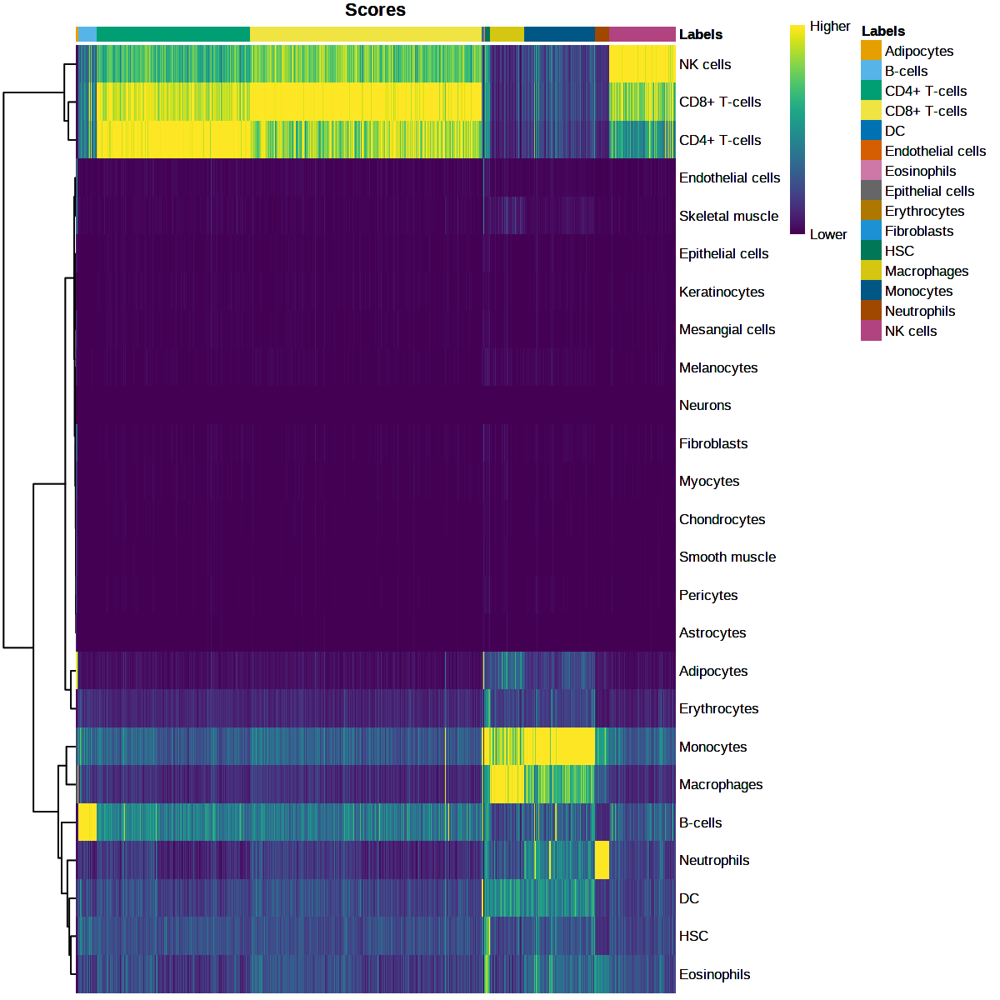

In [ ]:
# Generate a heatmap showing the scores for each cell and how well they match the reference annotations.
plotScoreHeatmap(pred)

In [ ]:
# Create a contingency table showing the relationship between assigned cell types
# (pruned by SingleR to remove low-confidence labels) and the original Seurat clusters.
table <- table(Prediction=pred$pruned.labels,
               Cluster=sce$seurat_clusters)
table

                   Cluster
Prediction            0   1   2   3   4   5   6   7   8   9  10  11  12  13
  Adipocytes          2   0   0   0   0   0   5   0   1   0   0   0   8  10
  B-cells             6   0   0   1   0   0   0   0   0 197   0   0   0  11
  CD4+ T-cells      877  42 441 441   0  33   0   0   0   0   0   0   0   1
  CD8+ T-cells      663 959 351 319  48 413   2   0   0   5   0   0   1   1
  DC                  0   0   1   0   0   0   4  14   0   0   0   0   0   1
  Endothelial cells   0   0   0   0   0   0   0   0   0   0   0   0   0   2
  Eosinophils         0   0   0   0   0   0   0   0   0   0   1   8   0   0
  Epithelial cells    1   0   0   1   0   0   0   0   0   0   0   0   0   3
  Erythrocytes        1   0   0   0   0   0   0   0   0   0   0   0   0   0
  Fibroblasts         0   0   0   0   0   0   0   0   0   0   0   0   0   1
  HSC                 1   0   0   0   0   0   0   2   0   0   0  55   0   3
  Macrophages         0   0   0   0   0   0 288  23   7   1  

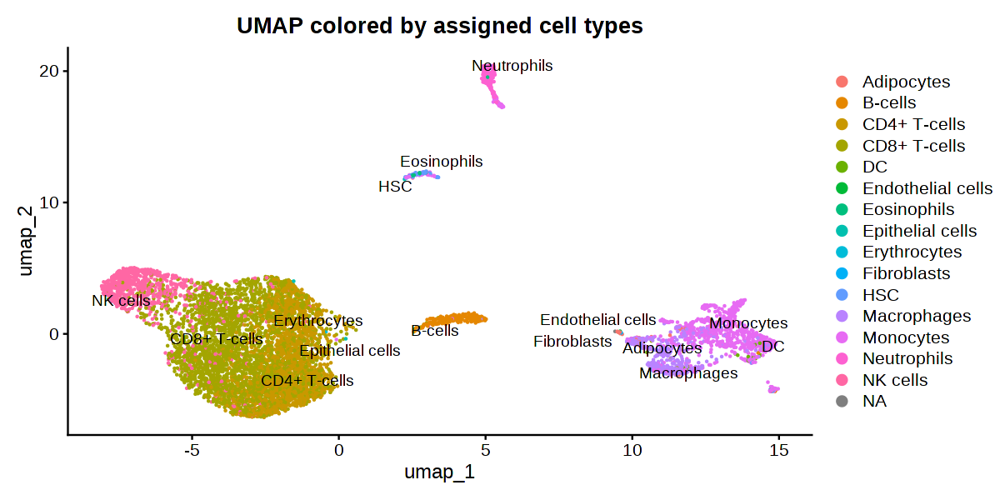

In [ ]:
options(repr.plot.width=10, repr.plot.height=5)
# Add the pruned cell type labels from SingleR to the Seurat object
seurat$prediction_celltype <- pred$pruned.labels

# Plot the UMAP, coloring cells by their assigned cell types
DimPlot(seurat, group.by = "prediction_celltype", label = TRUE, repel = TRUE) +
  ggtitle("UMAP colored by assigned cell types")


Attaching package: ‘pheatmap’


The following object is masked from ‘package:ComplexHeatmap’:

    pheatmap




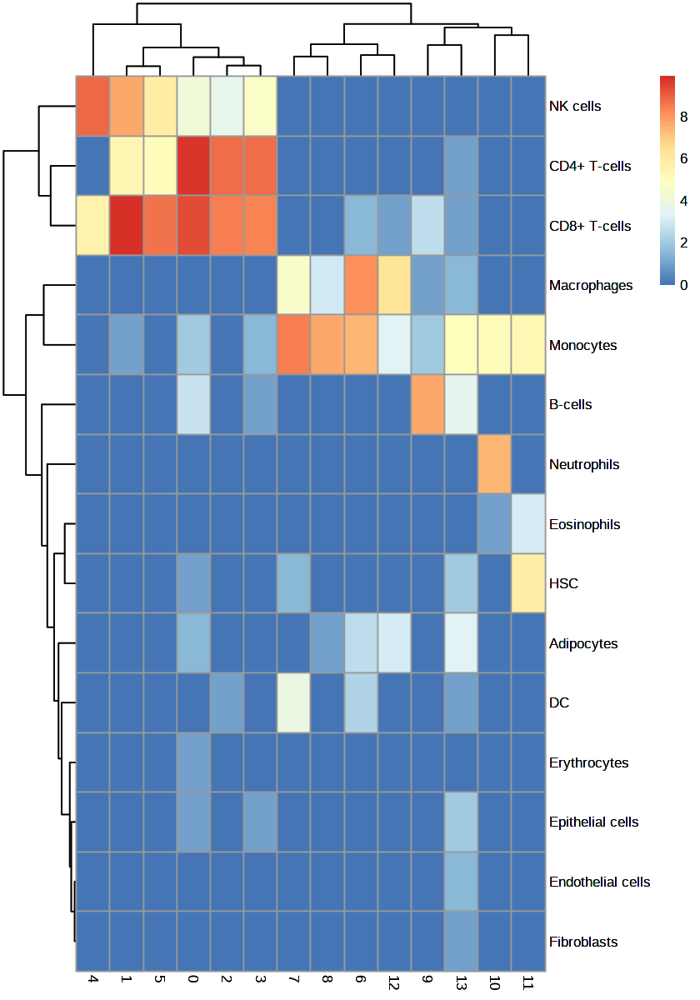

In [ ]:
options(repr.plot.width=7, repr.plot.height=10)
library(pheatmap)
# Create a heatmap of the log-transformed contingency table to visualize the relationship between
# predicted labels and original clusters.
p16 <- pheatmap(log2(table + 1))
p16

##**10. Manual Cell Annotation**

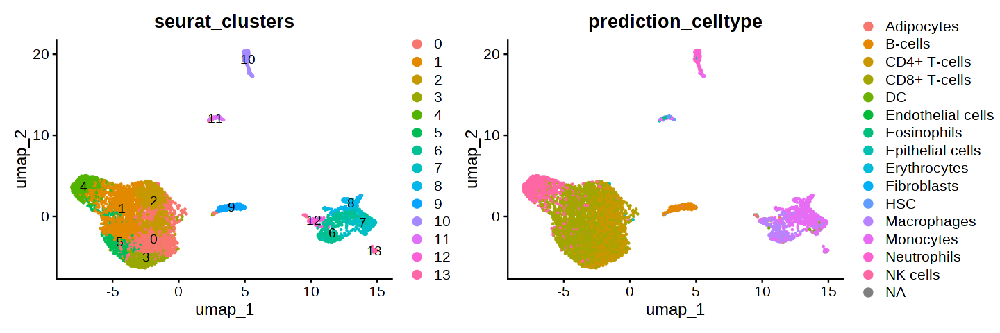

In [ ]:
options(repr.plot.width=12, repr.plot.height=4)

DimPlot(seurat, group.by = "seurat_clusters", label = T) | DimPlot(seurat, group.by = "prediction_celltype")

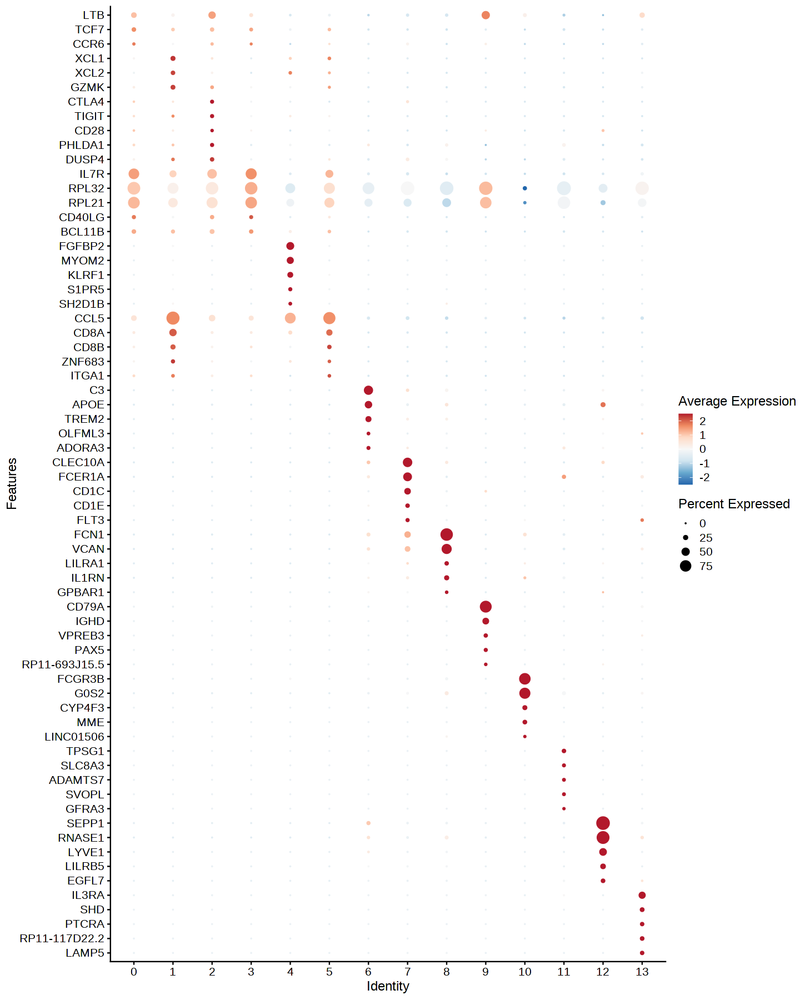

In [ ]:
options(repr.plot.width=12, repr.plot.height=15)
p15

In [ ]:
Idents(seurat) <- seurat$seurat_clusters
table(Idents(seurat))


   0    1    2    3    4    5    6    7    8    9   10   11   12   13 
1571 1200  805  789  525  503  465  389  213  206  204  102   97   68 

In [ ]:
new.cluster.ids <-
  c(
    "0" = "CD4 T Cells",
    "1" = "CD8 T Cells",
    "2" = "CD8 T Cells",
    "3" = "CD4 T Cells",
    "4" = "NK Cells",
    "5" = "CD8 T Cells",
    "6" = "Macrophages",
    "7" = "Dendritic Cells",
    "8" = "Monocytes",
    "9" = "B Cells",
    "10" = "Neutrophils",
    "11" = "Erythrocytes",
    "12" = "Macrophages",
    "13" = "Doublets"
  )
names(new.cluster.ids) <- levels(seurat)
seurat <- RenameIdents(seurat, new.cluster.ids)
seurat$celltype <- Idents(seurat) %>% as.character()
seurat <- subset(seurat, subset = celltype != "Doublets")

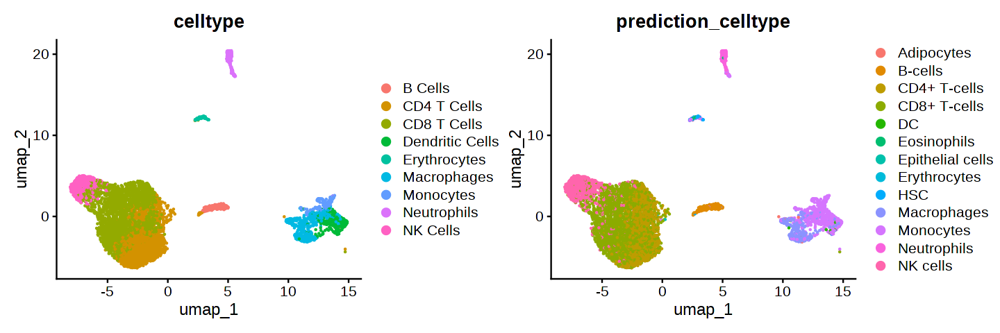

In [ ]:
options(repr.plot.width=12, repr.plot.height=4)

DimPlot(seurat, group.by = c("celltype", "prediction_celltype"))

## **11. Ambient RNA removal**

Ambient RNA refers to free-floating RNA molecules present in the solution outside cells, which can inadvertently be captured during single-cell RNA sequencing. This occurs when RNA from lysed or dying cells contaminates the droplets or wells containing intact cells, leading to erroneous gene expression measurements. Ambient RNA can particularly affect lowly expressed genes, artificially inflating their counts and obscuring true biological signals. To mitigate this issue, several computational tools have been developed to identify and correct for ambient RNA contamination. Notable programs include decontX, which estimates the ambient RNA profile and adjusts the expression matrix accordingly, and CellBender, which uses deep learning to model and remove ambient RNA signals. These tools are essential for enhancing the accuracy of downstream analyses by ensuring that the expression data reflects only the mRNA from intact, viable cells.

Here we're using the decontX tool for this step.

In [ ]:
seurat1 = seurat # save Seurat object
# Convert the Seurat object into a SingleCellExperiment object.
sce <- as.SingleCellExperiment(seurat)

# Perform decontamination of single-cell RNA-seq data.
decontX <- decontX(x = sce,
                   z = sce$celltype, # used to model expected expression profiles
                   batch = sce$batch_key) # account sample-specific effects

--------------------------------------------------

Starting DecontX

--------------------------------------------------

Fri Sep 20 21:56:57 2024 .. Analyzing cells in batch 'Azizi_7_normal'

Fri Sep 20 21:56:57 2024 .... Generating UMAP

Fri Sep 20 21:57:04 2024 .... Estimating contamination

Fri Sep 20 21:57:04 2024 ...... Completed iteration: 10 | converge: 0.0236

Fri Sep 20 21:57:04 2024 ...... Completed iteration: 20 | converge: 0.00733

Fri Sep 20 21:57:04 2024 ...... Completed iteration: 30 | converge: 0.004095

Fri Sep 20 21:57:04 2024 ...... Completed iteration: 40 | converge: 0.00406

Fri Sep 20 21:57:04 2024 ...... Completed iteration: 50 | converge: 0.002798

Fri Sep 20 21:57:04 2024 ...... Completed iteration: 60 | converge: 0.002719

Fri Sep 20 21:57:04 2024 ...... Completed iteration: 70 | converge: 0.002672

Fri Sep 20 21:57:05 2024 ...... Completed iteration: 80 | converge: 0.002411

Fri Sep 20 21:57:05 2024 ...... Completed iteration: 90 | converge: 0.003055

Fri Se

In [ ]:
decontX

class: SingleCellExperiment 
dim: 14601 7069 
metadata(1): decontX
assays(4): counts logcounts scaledata decontXcounts
rownames(14601): A1BG A2M ... ZZEF1 ZZZ3
rowData names(0):
colnames(7069): barcode_1937 barcode_1834 ... barcode_56235
  barcode_56693
colData names(30): orig.ident nCount_RNA ... decontX_contamination
  decontX_clusters
reducedDimNames(11): PCA HARMONY ... decontX_Azizi_1_normal_UMAP
  decontX_Azizi_1_tumor_ER/PR+_UMAP
mainExpName: RNA
altExpNames(0):

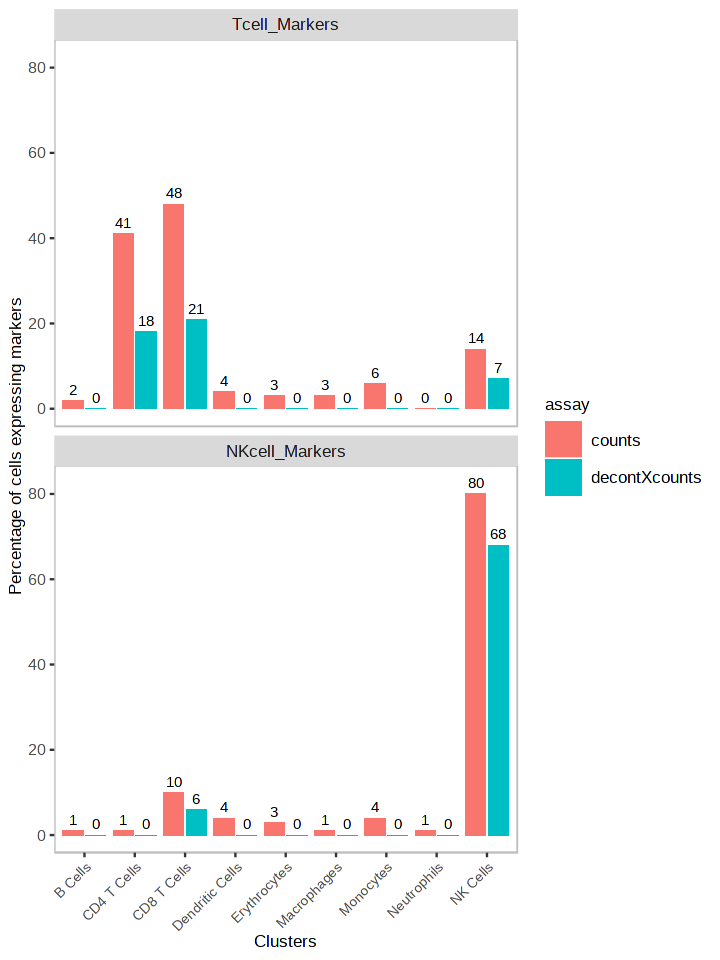

In [ ]:
options(repr.plot.width=6, repr.plot.height=8)

decontX$decontX_clusters = decontX$celltype

markers <- list(Tcell_Markers = c("CD3E", "CD3D"),
                NKcell_Markers = "GNLY")
plotDecontXMarkerPercentage(decontX,
                            markers = markers,
                            assayName = c("counts", "decontXcounts"))

In [ ]:
seurat_decontX <- CreateSeuratObject(counts = round(decontXcounts(decontX)), meta.data = as.data.frame(colData(decontX)))
seurat_decontX@reductions$umap = seurat1@reductions$umap
seurat <- seurat_decontX

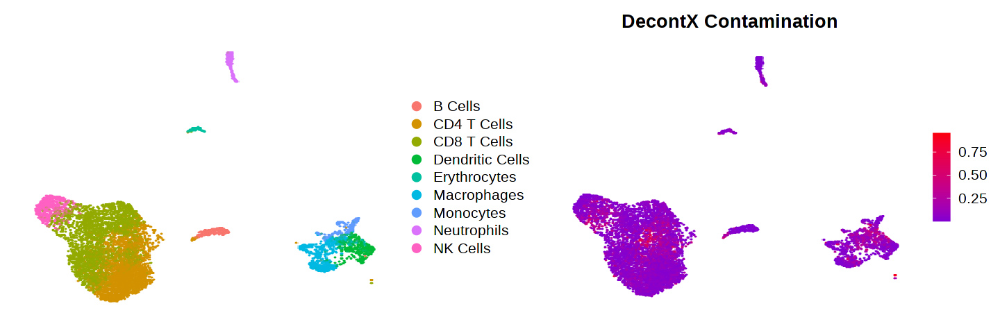

In [ ]:
options(repr.plot.width=12, repr.plot.height=4)
d1 <- DimPlot(seurat, group.by = c('celltype'), raster = T, pt.size = 2.5) + ggtitle("") & NoAxes()
d2 <- FeaturePlot(seurat, features = c('decontX_contamination'), raster = T, pt.size = 2.5, cols =c("#8000D2", "#FC000B")) + ggtitle("DecontX Contamination") & NoAxes()

d1 | d2

## Downstream Analysis

Downstream analysis in scRNA-seq involves a range of computational and statistical techniques applied after initial data preprocessing to gain deeper biological insights. This includes identifying marker genes, inferring cellular trajectories to explore differentiation pathways, and performing cell-type annotation. These analyses help to reveal cellular heterogeneity, map developmental lineages, and understand the functional roles of various cell populations in biological processes or disease contexts. In today's analysis, we will focus on inferring the differentiation trajectory of monocytes into macrophages.

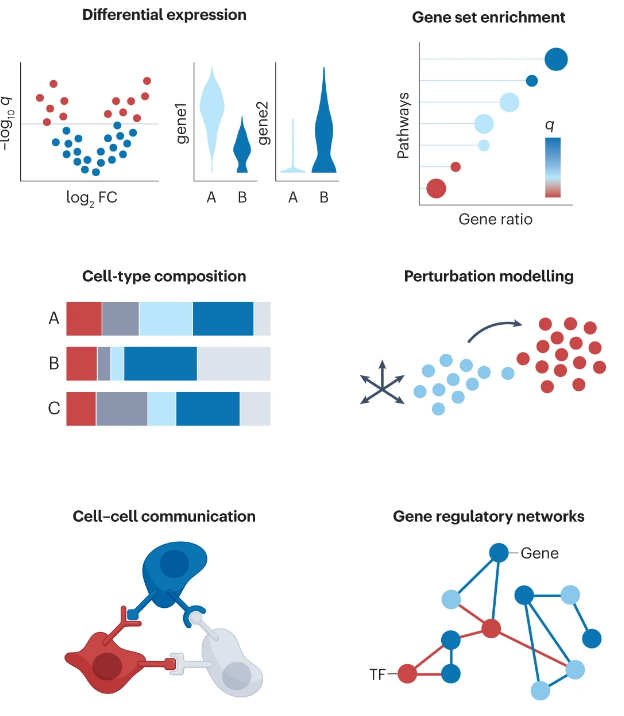

## **12. Trajectory Inference**

Even though samples are, traditionally, taken from a single experimental time point, a multitude of cell types can be observed. This diversity stems from the asynchronous nature of biological processes. As such, a range of the developmental process can be observed. Reconstructing the developmental landscape is the goal of the field coined trajectory inference (TI). This task is achieved by ordering the observed cellular states according to the developmental process. States are aligned along the developmental direction by mapping discrete annotations to a continuous domain - the so-called pseudotime.



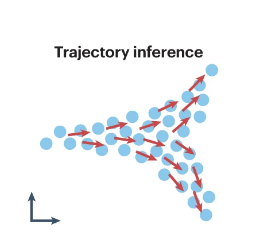
Source: [Heumos et al., 2023](https://www.nature.com/articles/s41576-023-00586-w)

In [ ]:
subset <- subset(seurat, subset = celltype %in% c("Monocytes", "Macrophages"))

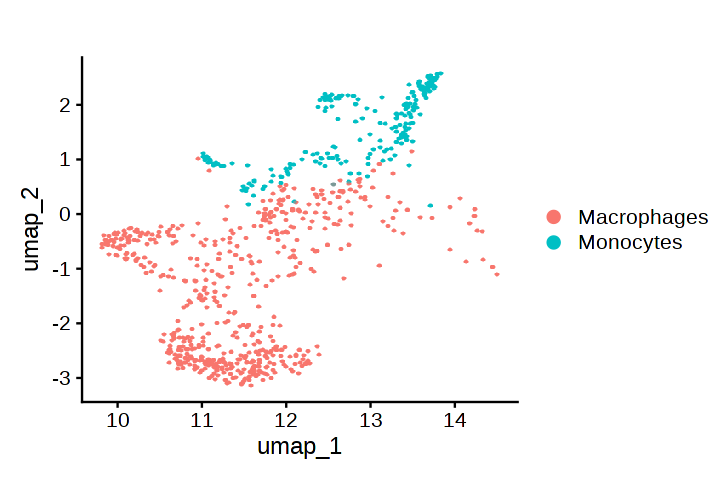

In [ ]:
options(repr.plot.width=6, repr.plot.height=4)
DimPlot(subset, group.by = c('celltype'), raster = T, pt.size = 3.5) + ggtitle("")

In [ ]:
cds <- SeuratWrappers::as.cell_data_set(subset)  # Converts the `seurat` object into a `cell_data_set` object, which is a fundamental class used by Monocle 3 for trajectory analysis.

Warning message:
“Layer ‘data’ is empty”
Warning message:
“Layer ‘scale.data’ is empty”


In [ ]:
reacreate.partition <- c(rep(1, length(cds@colData@rownames))) # Create a partition vector where all cells are assigned to partition 1
names(reacreate.partition) <- cds@colData@rownames # Assign cell names to the partition vector
reacreate.partition <- as.factor(reacreate.partition) # Convert the partition vector to a factor
cds@clusters$UMAP$partitions <- reacreate.partition # Update the Monocle 3 object with the new partition information
list_cluster <- subset$celltype # Retrieve the active cluster identities from the data object

cds@clusters$UMAP$clusters <- list_cluster # Update the Monocle 3 object with the cluster information

cds@int_colData@listData$reducedDims$UMAP <- subset@reductions$umap@cell.embeddings # Assign UMAP coordinates (cell embeddings) to the Monocle 3 object

In [ ]:
# Learn the graph structure for the cells, specifying that the graph should be learned with 300 centers
cds <- learn_graph(cds)

# Order the cells along the graph trajectory
cds <- order_cells(
  cds,
  reduction_method = 'UMAP',  # Use UMAP coordinates for ordering
  root_cells = colnames(cds[, clusters(cds) == c("Monocytes")])  # Specify the root cells for trajectory ordering
)

  |======================================================================| 100%


Cells aren't colored in a way that allows them to be grouped.



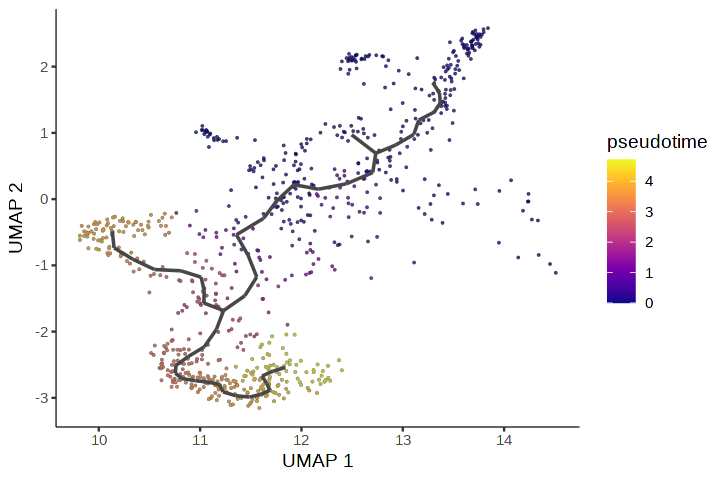

In [ ]:
options(repr.plot.width=6, repr.plot.height=4)

# Create a plot of cells with pseudotime coloring and additional customizations
p17 <- plot_cells(
  cds,                             # The cell_data_set object to plot
  rasterize = TRUE,                # Rasterize the plot for better performance with large datasets
  alpha = 0.5,                     # Set the transparency of the cells
  color_cells_by = 'pseudotime',   # Color the cells based on their pseudotime
  label_groups_by_cluster = TRUE,  # Label groups by cluster
  label_cell_groups = TRUE,        # Label cell groups
  label_branch_points = FALSE,     # Do not label branch points
  label_roots = FALSE,             # Do not label root cells
  label_leaves = FALSE             # Do not label leaf cells
)
# Display the plot
p17

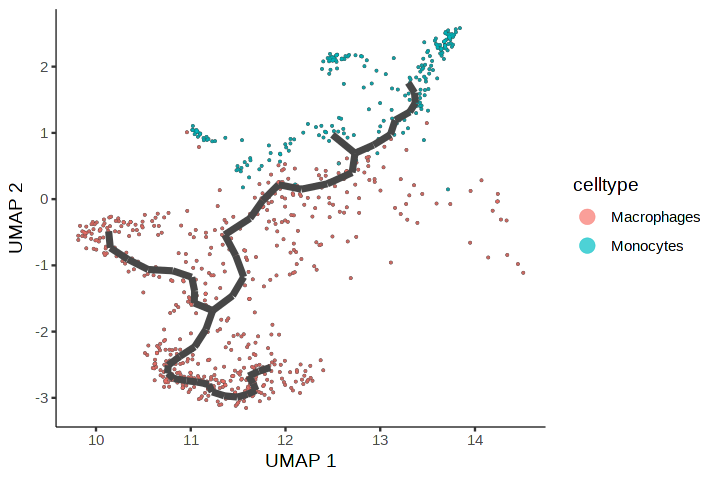

In [ ]:
# Extract metadata from the cell_data_set object
pseudo_metadata <- colData(cds)

# Convert the celltype column to character type
cds@colData$celltype <- cds@colData$celltype %>% as.character()

# Create a plot of cells colored by cell type with additional customizations
p18 <- plot_cells(
  cds,                               # The cell_data_set object to plot
  color_cells_by = 'celltype',       # Color the cells based on their cell type
  alpha = 0.7,                       # Set the transparency of the cells
  label_groups_by_cluster = TRUE,    # Label groups by cluster
  label_branch_points = FALSE,       # Do not label branch points
  label_roots = FALSE,               # Do not label root cells
  label_leaves = FALSE,              # Do not label leaf cells
  label_cell_groups = FALSE,         # Do not label cell groups
  trajectory_graph_segment_size = 1.5,  # Set the size of the trajectory graph segments
  group_label_size = 5,              # Set the size of the group labels
  rasterize = TRUE                   # Rasterize the plot for better performance with large datasets
)
# Display the plot
p18

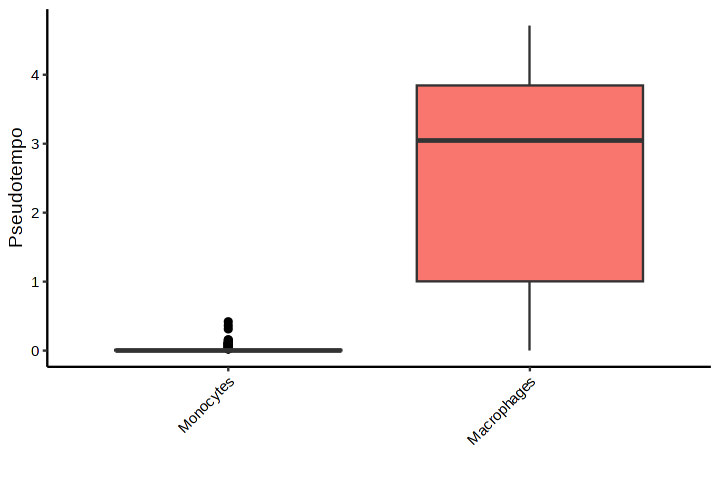

In [ ]:
# Add pseudotime values to the cell_data_set object
cds$monocle3_pseudotime <- pseudotime(cds)

# Convert the cell metadata to a data frame
data.pseudo <- as.data.frame(colData(cds))

# Create a boxplot of cell types versus pseudotime
p19 <- ggplot(data.pseudo,
             aes(
               monocle3_pseudotime,                      # X-axis: pseudotime
               reorder(celltype, monocle3_pseudotime, median),  # Y-axis: reorder cell types based on median pseudotime
               fill = celltype                          # Fill color based on cell type
             )) +
  geom_boxplot(outlier.colour = 'black') +        # Add boxplot with black-colored outliers
  theme_classic() +                               # Use a classic theme for the plot
  ylab("") +                                      # Remove y-axis label
  xlab("Pseudotempo") +                           # Set x-axis label
  coord_flip() +                                 # Flip coordinates for horizontal boxplot
  theme(
    axis.text = element_text(colour = 'black'),    # Set axis text color to black
    axis.text.x = element_text(angle = 45, hjust = 1)  # Rotate x-axis text for better readability
  ) & NoLegend()                                   # Remove the legend

# Display the plot
p19

In [ ]:
cds <- estimate_size_factors(cds)
# Perform graph test to identify modulated genes
modulated_genes <- graph_test(cds, neighbor_graph = "principal_graph")
# Select genes with q-value == 0 and Moran's I > 0.25, excluding specific gene types
genes <- row.names(subset(modulated_genes, q_value == 0 & morans_I > 0.25))
rm <- grepl("^RPS|^RPL|^MT-", genes)
genes <- genes[!rm]

  |===========================================================================| 100%, Elapsed 02:19


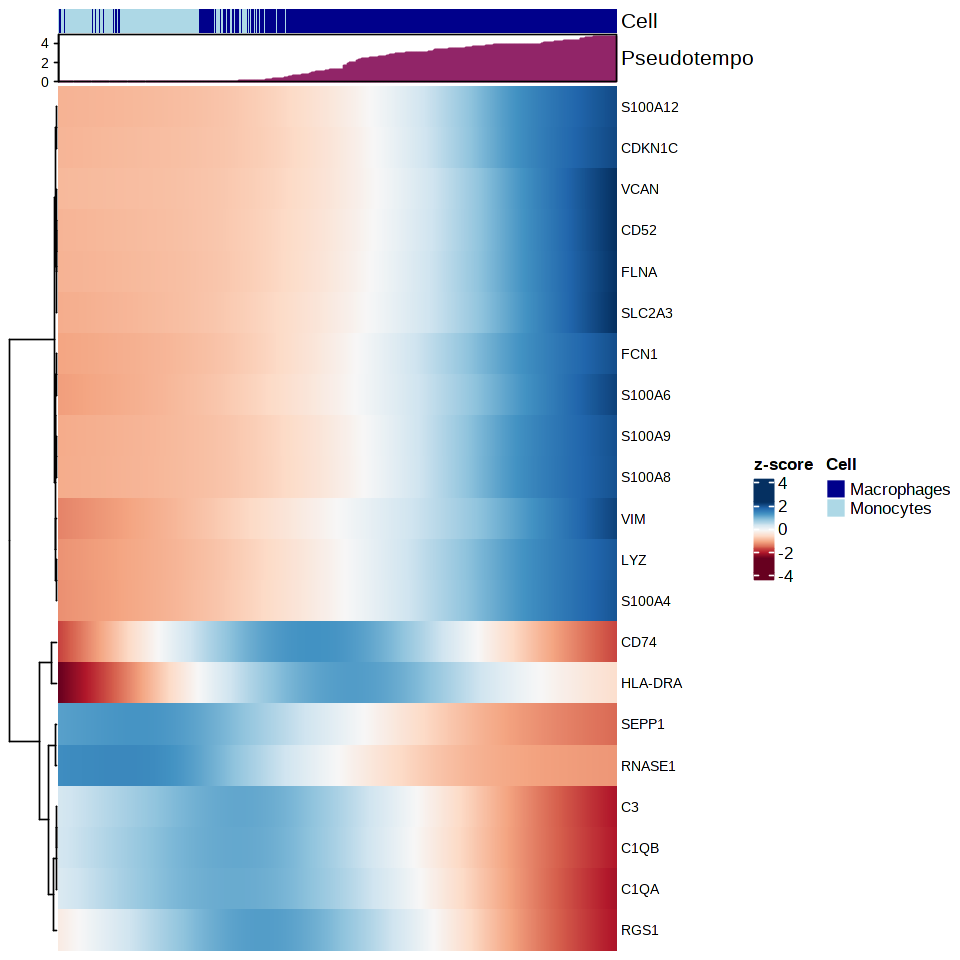

In [ ]:
options(repr.plot.width=8, repr.plot.height=8)
# Extract expression matrix for the selected genes and order by pseudotime
pt.matrix1 <- as.matrix(exprs(cds)[match(genes, rownames(rowData(cds))), rev(order(pseudotime(cds)))])

# Smooth the expression data using spline smoothing and normalize it
pt.matrix <- t(apply(pt.matrix1, 1, function(x) {
  smooth.spline(x, df = 3)$y
}))
pt.matrix <- t(apply(pt.matrix, 1, function(x) {
  (x - mean(x)) / sd(x)
}))

# Prepare pseudotime and celltype data for merging
pseudotime <- pseudotime(cds) %>% as.data.frame() # Get pseudotime data
pseudotime$cell <- rownames(pseudotime)           # Add cell names to pseudotime data

celltype <- cds@clusters$UMAP %>% as.data.frame() # Get celltype data
celltype$cell <- rownames(celltype) %>% as.character() # Add cell names to celltype data

# Merge pseudotime and celltype data
merge <- merge(pseudotime, celltype, by = 'cell') # Merge by cell name
merge <- merge[order(merge$.), ]  # Order by pseudotime

# Set column names of the expression matrix to cell clusters
colnames(pt.matrix) <- merge$clusters

# Define colors for cell types
ann_colors <- list(
  Cell = c(
    "Monocytes" = "lightblue",
    "Macrophages" = "darkblue"
  )
)

# Create a data frame for annotation with cell types
levels2 <- data.frame(
  Celltype = factor(colnames(pt.matrix), levels = c(
    "Monocytes", "Macrophages"
  ))
)

pal = c("Monocytes" = "lightblue", "Macrophages" = "darkblue")
# Create heatmap annotation
ha <- HeatmapAnnotation(
  Cell = colnames(pt.matrix),
  Pseudotempo = anno_barplot(merge$., gp = gpar(fill = 1:8616, col = '#912568')),
  col = list(Cell = pal)
)

# Create the heatmap
p20 <- Heatmap(
  pt.matrix,
  name = "z-score",
  col = mapal,
  show_row_names = TRUE,
  top_annotation = ha,
  show_column_names = FALSE,
  row_names_gp = gpar(fontsize = 8),
  row_dend_reorder = TRUE,
  clustering_method_rows = "ward.D2",
  clustering_method_columns = "ward.D2",
  row_title_rot = 0,
  cluster_rows = TRUE,
  cluster_row_slices = FALSE,
  cluster_columns = FALSE,
  raster_by_magick = TRUE,
  raster_quality = 2
) %>% ggplotify::as.ggplot()

# Display the heatmap
p20